In [299]:
import numpy as np
import pandas as pd
import codecs
import json
from scipy.spatial.distance import cdist, pdist, squareform
from scipy.linalg import eigh
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import community as community_louvain
import networkx as nx
import phate
from sklearn.manifold import TSNE
import scprep
import os
%matplotlib inline

In [300]:
def load_json_files(file_path):
    '''
    Loads data from a json file

    Inputs:
        file_path   the path of the .json file that you want to read in

    Outputs:
        my_array    this is a numpy array if data is numeric, it's a list if it's a string

    '''

    #  load data from json file
    with codecs.open(file_path, 'r', encoding='utf-8') as handle:
        json_data = json.loads(handle.read())

    # if a string, then returns list of strings
    if not isinstance(json_data[0], str):
        # otherwise, it's assumed to be numeric and returns numpy array
        json_data = np.array(json_data)

    return json_data

def gaussian_kernel(X, kernel_type="gaussian", sigma=3.0, k=5):
    """gaussian_kernel: Build an adjacency matrix for data using a Gaussian kernel
    Args:
        X (N x d np.ndarray): Input data
        kernel_type: "gaussian" or "adaptive". Controls bandwidth
        sigma (float): Scalar kernel bandwidth
        k (integer): nearest neighbor kernel bandwidth
    Returns:
        W (N x N np.ndarray): Weight/adjacency matrix induced from X
    """
    _g = "gaussian"
    _a = "adaptive"

    kernel_type = kernel_type.lower()
    D = squareform(pdist(X))
    if kernel_type == "gaussian":  # gaussian bandwidth checking
        print("fixed bandwidth specified")

        if not all([type(sigma) is float, sigma > 0]):  # [float, positive]
            print("invalid gaussian bandwidth, using sigma = max(min(D)) as bandwidth")
            D_find = D + np.eye(np.size(D, 1)) * 1e15
            sigma = np.max(np.min(D_find, 1))
            del D_find
        sigma = np.ones(np.size(D, 1)) * sigma
    elif kernel_type == "adaptive":  # adaptive bandwidth
        print("adaptive bandwidth specified")

        # [integer, positive, less than the total samples]
        if not all([type(k) is int, k > 0, k < np.size(D, 1)]):
            print("invalid adaptive bandwidth, using k=5 as bandwidth")
            k = 5

        knnDST = np.sort(D, axis=1)  # sorted neighbor distances
        sigma = knnDST[:, k]  # k-nn neighbor. 0 is self.
        del knnDST
    else:
        raise ValueError

    W = ((D**2) / sigma[:, np.newaxis]**2).T
    W = np.exp(-1 * (W))
    W = (W + W.T) / 2  # symmetrize
    W = W - np.eye(W.shape[0])  # remove the diagonal
    return W

def diff_map_info(W):
    '''
    Construct the information necessary to easily construct diffusion map for any t

    Inputs:
        W           a numpy array of size n x n containing the affinities between points

    Outputs:

        diff_vec    a numpy array of size n x n-1 containing the n-1 nontrivial eigenvectors of Markov matrix 
                    as columns
        diff_eig    a numpy array of size n-1 containing the n-1 nontrivial eigenvalues of Markov matrix

        We assume the convention that the coordinates in the diffusion vectors are in descending order
        according to eigenvalues.
    '''
    # Compute the eigenpairs of the Symmetric Matrix Ms
    n = W.shape[0]
    Ddiag = np.diag(W.sum(axis=1)**(-0.5)) 
    Ms = (Ddiag) @ W @ (Ddiag)
    eigvalues, eigvecs = np.linalg.eigh(Ms)
    
    # Calculate and sort the eigenvalues of the Markov Matrix M
    indices = np.argsort(-1*eigvalues)
    diff_eig = eigvalues[indices][1:n]
    
    # Calculate the (normalized) eigenvectors of the Markov Matrix M
    eigvectors = eigvecs[:, indices]
    eigvectors = Ddiag @ eigvectors
    eigvectors = (eigvectors) / np.linalg.norm(eigvectors, axis = 0)
    diff_vec = eigvectors[:, 1:n]

    # return the info for diffusion maps
    return diff_vec, diff_eig

def get_diff_map(diff_vec, diff_eig, t):
    '''
    Construct a diffusion map at t from eigenvalues and eigenvectors of Markov matrix

    Inputs:
        diff_vec    a numpy array of size n x n-1 containing the n-1 nontrivial eigenvectors of Markov matrix 
                    as columns
        diff_eig    a numpy array of size n-1 containing the n-1 nontrivial eigenvalues of Markov matrix
        t           diffusion time parameter t

    Outputs:
        diff_map    a numpy array of size n x n-1, the diffusion map defined for t
    '''
    n = diff_vec.shape[0]
    diff_map = np.zeros((n,n-1))
    
    for j in range(n):
        for i in range(n-1):
            diff_map[j][i] = (diff_eig[i]**t) * diff_vec[j][i]
    
    return diff_map

def get_gauss_function(lambd, mu, sigmasq):
    g = np.exp((-(lambd - mu)**2)/(2*sigmasq))
    return g

def get_kron(i, n):
    kron = np.zeros(n)
    kron[i] = 1
    return kron

# 1) Introduction

This assignment will explore graph clustering and signal processing, two common paradigms for analyzing data that can be represented as a graph. These graph based methods can generally be applied to any high dimensional dataset. 

Clustering is a key method to understand and unravel heterogenity in high dimensional data. Throughout the assignment, three clustering methods will be analyzed, being k-means clustering, Louvain clustering and spectral clustering. The latter method uses the graph Laplacian eigenvectors as a set of coordinates, which means that clusters are formed using graph geometry. 

Graph signal processing serves as a tool for manipulating data that rests on a graph. The method takes some of the major advances in classical signal processing and applies them to graphs. The assignment will go deeper into the Graph Fourier Transform, which allows studying the behavior of data in the frequency space. 

# 2) Preliminaries

This section will go over the key features of the graph Laplacian spectra. First of all, the graph Laplacian will be defined. Two types will be investigated, being the combinatorial graph Laplacian and the normalized graph Laplacian, which are respectively defined as follows:

$$\mathcal{L}^c = D - W$$

$$\mathcal{L}^s = D^{-1/2}\mathcal{L}^c D^{-1/2}$$

where D is the degree matrix for a graph on N vertices with weights W. In the following discussion, general Laplacians will be denoted by $\mathcal{L}$, whereas vectors and matrices related to a specific normalization will feature a superscript. The Fourier basis, whose eigenvectors form a basis for frequency analysis, is the eigenbasis of the Laplacian $\mathcal{L} = \Psi \Lambda \Psi^T$


## 2.1) Ordering the Laplacian Basis

The set of eigenpairs will be denoted as $B = (\Psi, \Lambda)$, where

$$\Psi = \{\psi_i\}^{N}_{i=1}$$
$$\Lambda = \{0 = \lambda_1 \leq \lambda_2 \leq \dots \leq \lambda_N \}$$

The ordening will retain the classical notions of low frequency (eigenvalues close to zero) and high frequency (eigenvalues close to one). The smoothness of the Fourier basis functions corresponds to their eigenvalue. Note that the ordering holds for both $\mathcal{L}$.


## 2.2) Graph Fourier Transform

The goal is to compute the orthonormal expansion of signals in the Fourier basis of our graph, which is given by the Graph Fourier Transform. For a signal $s \in \mathbb{R}^N$ defined on the vertices of a graph, the graph Fourier transform can be written as:

$$\hat{s} (\lambda_l) = \langle s, \psi_l \rangle$$

Or more generally written:

$$ \hat{s} = \Psi^T s$$

With the inverse graph Fourier transform given by:

$$s = \Psi \hat{s}$$

Throughout the assignment, this frequency-based representation of input signals (e.g. cluster labels) will be investigated. A cluster label signal for cluster $C_i$ has a 1 on each node that is a member of $C_i$ and a 0 otherwise.


## 2.3) Laplacian Spectra

This subsection will discuss a few things about the eigensystems of $\mathcal{L}$. The distribution of the
graph Laplacian eigenvalues is refered to as the spectrum of the graph. The meaning of the eigenvalues of $\mathcal{L}$ (i.e., how they relate to graph properties like connectivity) is the key subject of the field of Spectral Graph Theory. Note that many of the design choices for the algorithms revolve around constructing a graph that has certain properties (adaptive bandwidth, positive semi de nite kernels) or manipulating a graph spectrum in specific ways. In the following paragrahps, a few easy derivations that are good things to know for all graphs will be elaborated. Note that the he normalized Laplacian $\mathcal{L}^s$ and the combinatorial Laplacian $\mathcal{L}^c$ do not share eigenvectors or eigenvalues.

For the combinatorial Laplacian, the easiest observation to make is that the first eigenvector is the all ones vector $\psi_1^c = \mathbb{1}$ with eigenvalue $\lambda_1^c = 0$. Beyond $\lambda_1^c$, the eigenvalues magnitude of the combinatorial Laplacian may scale with degree, though many other properties change the way they distribute.

For the normalized Laplacian, the first eigenpair is:

$$ \{ \lambda_1^s, \psi_1^s \} = \{0, \frac{\sqrt{d}}{||\sqrt{d}||} \}$$

Because the normalized Laplacian has a degree normalization (the sandwiched inverse square roots), its eigenvalues fall in the interval $0 \leq \lambda_i \leq 2$ for all $i$ where $\lambda_N = 2$ if and only if the graph is bipartite. It also turns out that the diffusion map matrices share eigenvectors ($\phi_i = psi_i$), while their eigenvalues are related by $\lambda_i^s = 1 - \mu_i$. If a normalization is made or the affinity matrix W is chosen to be positive semi definite, then it is obvious that $0 \leq \lambda_i \leq 1$.

A final important aspect is that the number of zero eigenvalues for any $\mathcal{L}$ encodes the number of connected components. The corresponding eigenvectors serve as indicators for each disconnected component. To see this, note that the columns and rows of any disconnected Laplacian can be sorted to yield a block diagonal matrix. Thus, the full Laplacian eigensystem is the union of the block Laplacian eigensystems. A fuzzy but useful observation from this is that graphs that are nearly disconnected will have low frequency eigenvectors that have indicator-like properties.




# 3) Filtering Signals on the Stochastic Block Model

One of the most common synthetic examples for evaluating clustering algorithms is the Stochastic Block Model (SBM). This part will begin by generating the synthetic SBM dataset:



In [583]:
def sbm(N, k, pij, pii, sigma):
    """sbm: Construct a stochastic block model

    Args:
        N (integer): Graph size
        k (integer): Number of clusters
        pij (float): Probability of intercluster edges
        pii (float): probability of intracluster edges
        sigma (float): Variance for the Gaussian noise in the clusters

    Returns:
        A (numpy.array): Adjacency Matrix
        gt (numpy.array): Ground truth cluster labels
        coords(numpy.array): plotting coordinates for the sbm
    """
    # Create the Ground truth cluster labels
    unifPoints = int(N/k)
    rest = N - unifPoints * k
    gt_list = []

    for i in np.arange(0,k):
        if (rest > i):
            gt_list.extend(unifPoints * [i])
            gt_list.append(i)
        else:
            gt_list.extend(unifPoints * [i])
            
    gt = np.array(gt_list)
    
    # Create the Adjacency Matrix
    unif_matrix = np.random.rand(N,N)
    cluster_matrix = np.zeros((N,N))
    
    for i in np.arange(0,N):
        for j in np.arange(0,N):
            if (gt[i] == gt[j]):
                cluster_matrix[i,j] = pii
            else:
                cluster_matrix[i,j] = pij
                
    A = (unif_matrix < cluster_matrix).astype(int)
    
    # Make sure the diagonal elements are one
    np.fill_diagonal(A, 0)
    
    # Make it a symmetric matrix
    for i in np.arange(0,N):
        for j in np.arange(i,N):
            A[j,i] = A[i,j]
    
    # Create the plotting coordinates for the sbm
    coords_list = []
    t = np.linspace(0, 2*np.pi, k, endpoint=False)
    x_mean = np.cos(t)
    y_mean = np.sin(t)
    
    for j in gt:
        x = x_mean[j] + np.random.normal(0,np.sqrt(sigma))
        y = y_mean[j] + np.random.normal(0,np.sqrt(sigma))
        coords_list.append([x,y])
        
    coords = np.array(coords_list)
    
    return A, gt, coords

In [302]:
def L(A, normalized=True):
    """L: compute a graph laplacian

    Args:
        A (N x N np.ndarray): Adjacency matrix of graph
        normalized (bool, optional): Normalized or combinatorial Laplacian

    Returns:
        L (N x N np.ndarray): graph Laplacian
    """
    D = np.diag(A.sum(axis=1))
    D_sqrtinv = np.diag(A.sum(axis=1)**(-0.5))
    Lc = D - A
    
    if (normalized == True):
        L = D_sqrtinv @ Lc @ D_sqrtinv
    else:
        L = Lc
        
    return L

In [303]:
def compute_fourier_basis(L):
    """compute_fourier_basis: Laplacian Diagonalization

    Args:
        L (N x N np.ndarray): graph Laplacian

    Returns:
        e (N x 1 np.ndarray): graph Laplacian eigenvalues
        psi (N x N np.ndarray): graph Laplacian eigenvectors
    """
    evalues, evectors = np.linalg.eigh(L)
    indices = np.argsort(evalues)
    e = evalues[indices]
    psi = evectors[indices]
    return e, psi

In [304]:
def gft(s, psi):
    """gft: Graph Fourier Transform (GFT)

    Args:
        s (N x d np.ndarray): Matrix of graph signals.  Each column is a signal.
        psi (N x N np.ndarray): graph Laplacian eigenvectors
    Returns:
        s_hat (N x d np.ndarray): GFT of the data
    """
    s_hat = psi.T @ s
    return s_hat

In [305]:
def filterbank_matrix(psi, e, h):
    """filterbank_matrix: build a filter matrix using the input filter h

    Args:
        psi (N x N np.ndarray): graph Laplacian eigenvectors
        e (N x 1 np.ndarray): graph Laplacian eigenvalues
        h (function handle): A function that takes in eigenvalues
        and returns values in the interval (0,1)

    Returns:
        H (N x N np.ndarray): Filter matrix that can be used in the form
        filtered_s = H@s
    """
    N = len(e)
    h_lambda = np.zeros(N)
    for i in np.arange(N):
        h_lambda[i] = h(e[i])
    H_Lambda = np.diag(h_lambda)
    H = psi @ H_Lambda @ psi.T
    
    return H

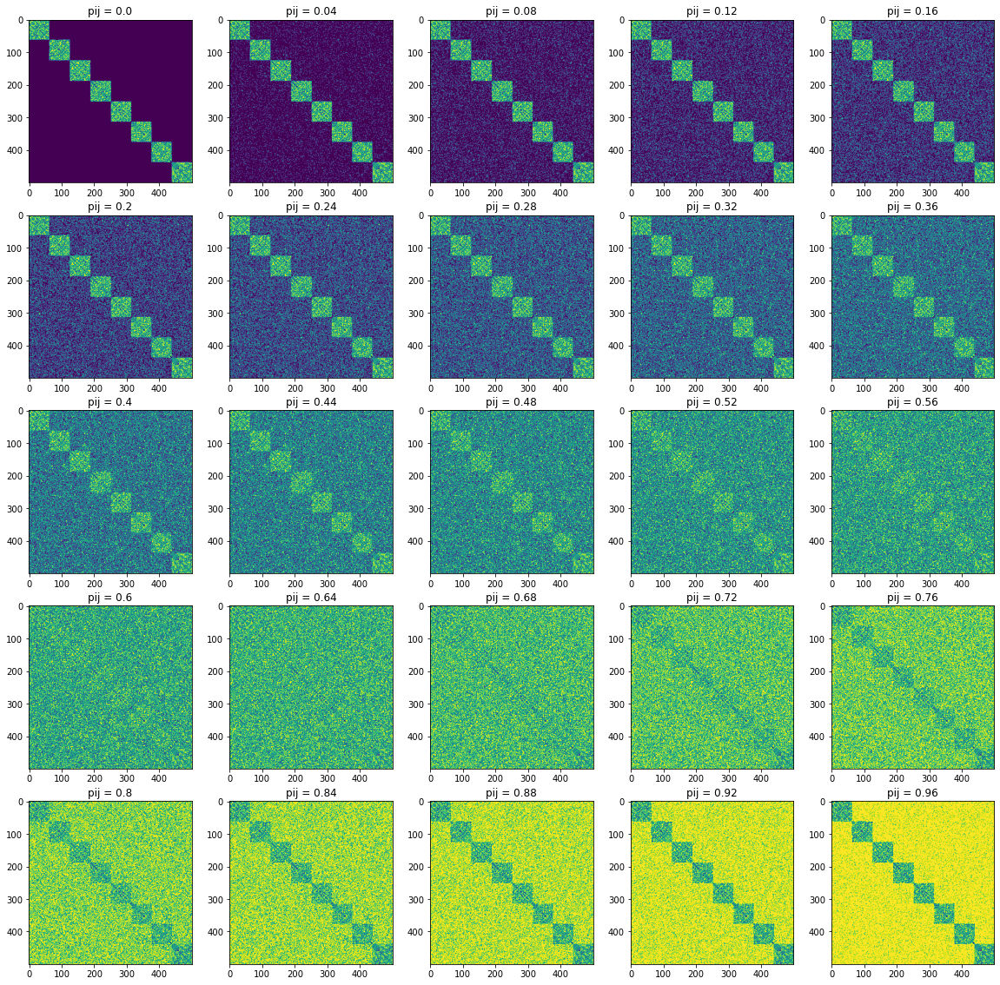

In [276]:
mn = 5

f, axes = plt.subplots(nrows = mn, ncols = mn, figsize = (20,20))
axes = axes.ravel()
num = 0

for i in range(mn*mn):
    axes[num].set_title(f'pij = {i*(1/(mn*mn))}')
    A, gt, coords = sbm(500, 8, i*(1/(mn*mn)), 0.65, 0.01)
    axes[num].imshow(A)
    num += 1

plt.show()

In [297]:
Adj, gtruth, coordsBlobs = sbm(500, 8, 0.40, 0.90, 0.01)
Ls = L(Adj, normalized=True)
evalues, evectors = compute_fourier_basis(Ls)

onehot_encoded = []
for value in gtruth:
    letter = [0 for _ in range(8)]
    letter[value] = 1
    onehot_encoded.append(letter)
s_ohe = np.array(onehot_encoded)

s_hat_ohe = abs(gft(s_ohe, evectors))

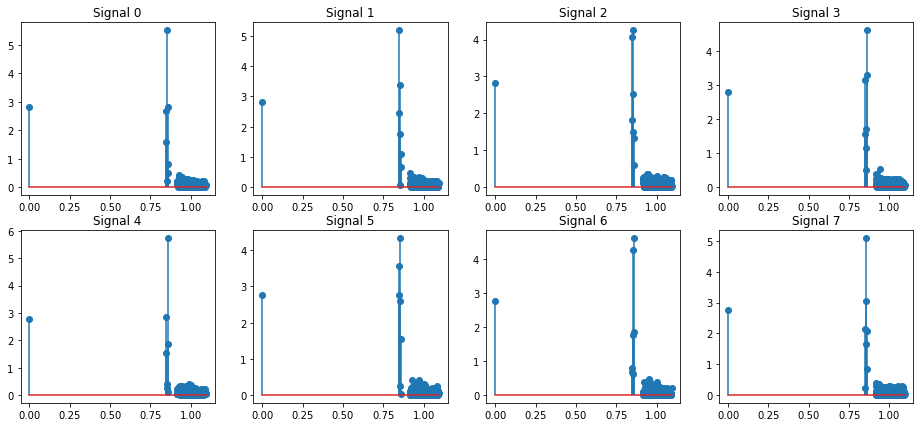

In [298]:
f, axes = plt.subplots(nrows = 2, ncols = 4, figsize = (16,7))
axes = axes.ravel()
num = 0

for i in range(8):
    axes[num].set_title(f'Signal {i}')
    axes[num].stem(evalues, s_hat_ohe[:,i])
    num += 1

plt.show()

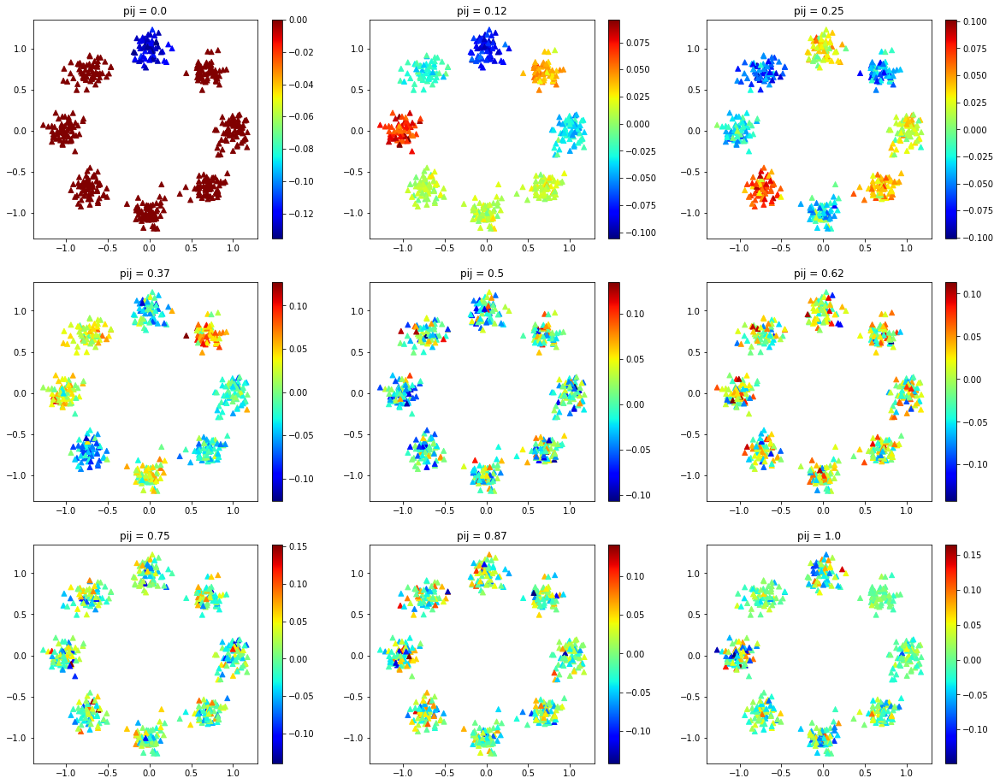

In [64]:
mn = 3
fig, axes = plt.subplots(nrows = mn, ncols = mn, figsize = (20, 16))
axes = axes.ravel()
num = 0

my_cmap = plt.get_cmap('jet')

for i in np.arange(0,mn*mn):
    Adj, gtruth, coordsBlobs = sbm(500, 8, i*(1.12/(mn*mn)), 0.65, 0.01)
    Ls = L(Adj, normalized=True)
    evalues, evectors = compute_fourier_basis(Ls)
    scat = axes[num].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = evectors[:,1], cmap = my_cmap, marker ='^')
    axes[num].set_title(f'pij = {round(i*(1.12/(mn*mn)),2)}')
    plt.colorbar(scat, ax = axes[num])
    num += 1

plt.show()

In [459]:
c = 0.80
Adj, gtruth, coordsBlobs = sbm(500, 8, 0.04, 0.65, 0.01)
Ls = L(Adj, normalized=True)
evalues, evectors = compute_fourier_basis(Ls)

H_filter_blob = filterbank_matrix(evectors, evalues, lambda x: int(x<c))

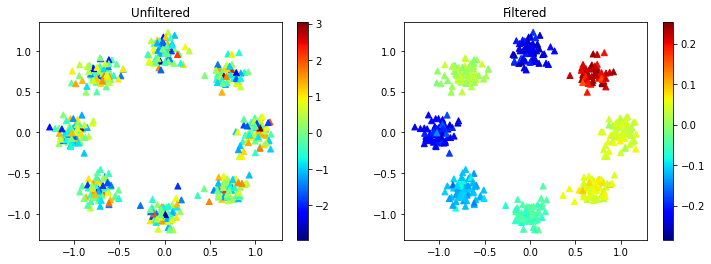

In [460]:
s_gauss = np.random.normal(0, 1, 500)

s_non_filtered = abs(evectors.T @ s_gauss)
s_filtered = H_filter_blob @ s_gauss
s_hat_filtered = abs(evectors.T @ H_filter_blob @ s_gauss)

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 4))
axes = axes.ravel()
num = 0

scat = axes[0].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = s_gauss, cmap = my_cmap, marker ='^')
axes[0].set_title(f'Unfiltered')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = s_filtered, cmap = my_cmap, marker ='^')
axes[1].set_title(f'Filtered')
plt.colorbar(scat, ax = axes[1])


plt.show()

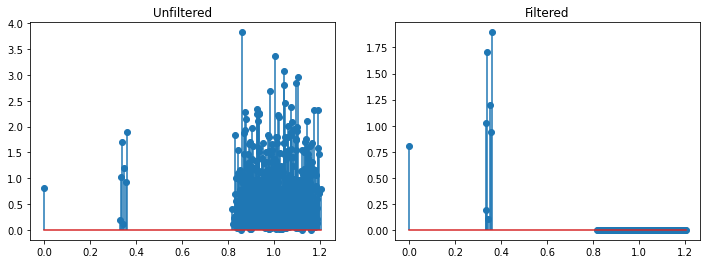

In [461]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 4))
axes = axes.ravel()
num = 0

axes[0].stem(evalues, s_non_filtered)
axes[0].set_title(f'Unfiltered')
axes[1].stem(evalues, s_hat_filtered)
axes[1].set_title(f'Filtered')
plt.show()

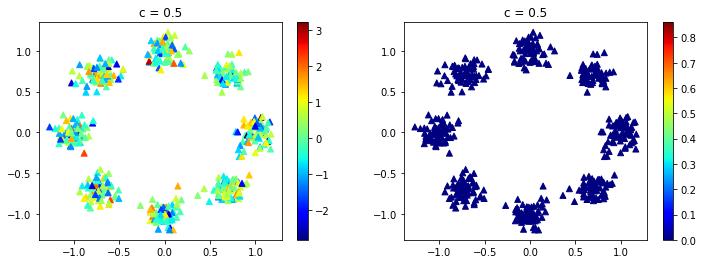

In [70]:
s_gauss = np.random.normal(0, 1, 500)

s_non_filtered = abs(evectors.T @ s_gauss)
s_hat_filtered = abs(evectors.T @ H_filter_blob @ s_gauss)

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 4))
axes = axes.ravel()
num = 0

scat = axes[0].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = s_gauss, cmap = my_cmap, marker ='^')
axes[0].set_title(f'c = {c}')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = s_hat_filtered, cmap = my_cmap, marker ='^')
axes[1].set_title(f'c = {c}')
plt.colorbar(scat, ax = axes[1])


plt.show()

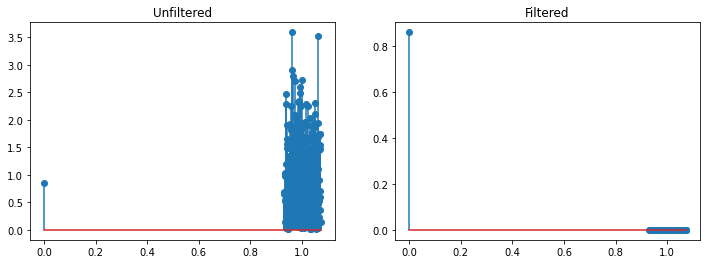

In [71]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 4))
axes = axes.ravel()
num = 0

axes[0].stem(evalues, s_non_filtered)
axes[0].set_title(f'Unfiltered')
axes[1].stem(evalues, s_hat_filtered)
axes[1].set_title(f'Filtered')
plt.show()

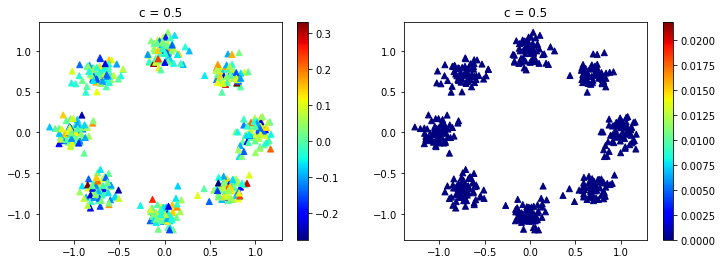

In [72]:
s_gauss = np.random.normal(0, 0.1, 500)

s_non_filtered = abs(evectors.T @ s_gauss)
s_hat_filtered = abs(evectors.T @ H_filter_blob @ s_gauss)

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 4))
axes = axes.ravel()
num = 0

scat = axes[0].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = s_gauss, cmap = my_cmap, marker ='^')
axes[0].set_title(f'Unfiltered')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = s_hat_filtered, cmap = my_cmap, marker ='^')
axes[1].set_title(f'Filtered')
plt.colorbar(scat, ax = axes[1])


plt.show()

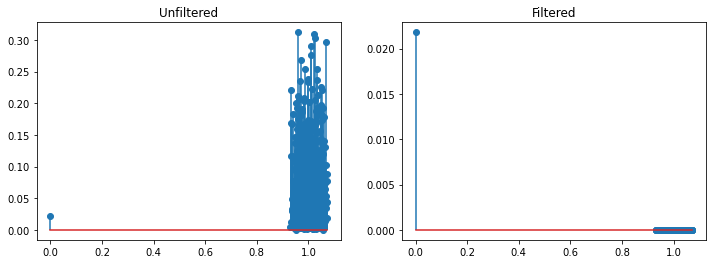

In [73]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 4))
axes = axes.ravel()
num = 0

axes[0].stem(evalues, s_non_filtered)
axes[0].set_title(f'Unfiltered')
axes[1].stem(evalues, s_hat_filtered)
axes[1].set_title(f'Filtered')
plt.show()

# 4) Filtering Signals on the Swiss Roll

In [142]:
swissPoints = load_json_files("/Users/louisdeschuttere/Documents/Yale University/Semester 1/Unsupervised Learning/Assignments/Homework2/data/swiss_roll_points.json")
swissLabels = load_json_files("/Users/louisdeschuttere/Documents/Yale University/Semester 1/Unsupervised Learning/Assignments/Homework2/data/swiss_roll_labels.json")

In [143]:
W = gaussian_kernel(swissPoints, kernel_type = "adaptive", k=10)
diff_vec, diff_eig = diff_map_info(W)
diff_map = get_diff_map(diff_vec, diff_eig, 1)

low_freq = np.sin(swissLabels)
med_freq = np.sin(20 * swissLabels)
hig_freq = np.sin(100 * swissLabels)

adaptive bandwidth specified


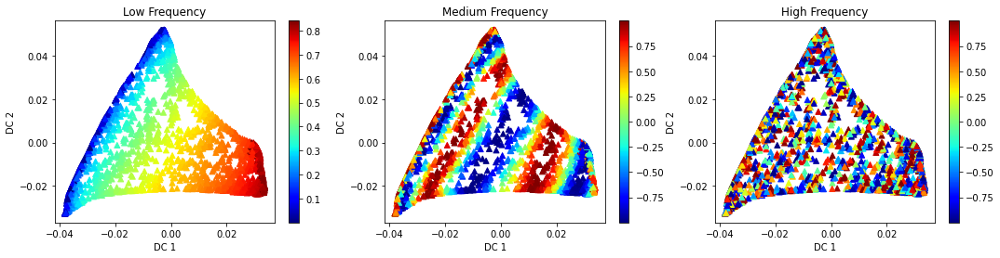

In [144]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

scat = axes[0].scatter(diff_map[:, 0], diff_map[:, 1], c = low_freq, cmap = my_cmap, marker ='^')
axes[0].set_title('Low Frequency')
axes[0].set_xlabel(f'DC {1}')
axes[0].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[0])

scat = axes[1].scatter(diff_map[:, 0], diff_map[:, 1], c = med_freq, cmap = my_cmap, marker ='^')
axes[1].set_title('Medium Frequency')
axes[1].set_xlabel(f'DC {1}')
axes[1].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[1])

scat = axes[2].scatter(diff_map[:, 0], diff_map[:, 1], c = hig_freq, cmap = my_cmap, marker ='^')
axes[2].set_title('High Frequency')
axes[2].set_xlabel(f'DC {1}')
axes[2].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[2])

plt.show()

In [189]:
L_swiss = L(W, normalized=True)
eval_swiss, evec_swiss = compute_fourier_basis(L_swiss)
H_LPfilter_swiss = filterbank_matrix(evec_swiss, eval_swiss, lambda x: int(x<0.1))
H_HPfilter_swiss = filterbank_matrix(evec_swiss, eval_swiss, lambda x: int(x>0.3))

s_lowfreq = abs(gft(low_freq, evec_swiss))
s_medfreq = abs(gft(med_freq, evec_swiss))
s_higfreq = abs(gft(hig_freq, evec_swiss))

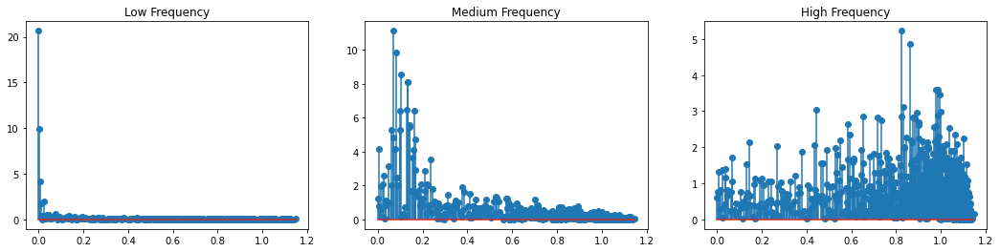

In [190]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

axes[0].set_title(f'Low Frequency')
axes[0].stem(eval_swiss, s_lowfreq, linefmt=None, markerfmt=None, basefmt=None)

axes[1].set_title(f'Medium Frequency')
axes[1].stem(eval_swiss, s_medfreq, linefmt=None, markerfmt=None, basefmt=None)

axes[2].set_title(f'High Frequency')
axes[2].stem(eval_swiss, s_higfreq, linefmt=None, markerfmt=None, basefmt=None)

plt.show()

In [191]:
low_freq_shift = np.sin(swissLabels + np.pi)
med_freq_shift = np.sin(20 * swissLabels + np.pi)
hig_freq_shift = np.sin(100 * swissLabels + np.pi)

s_low_freq_shift = abs(gft(low_freq_shift, evec_swiss))
s_med_freq_shift = abs(gft(med_freq_shift, evec_swiss))
s_hig_freq_shift = abs(gft(hig_freq_shift, evec_swiss))

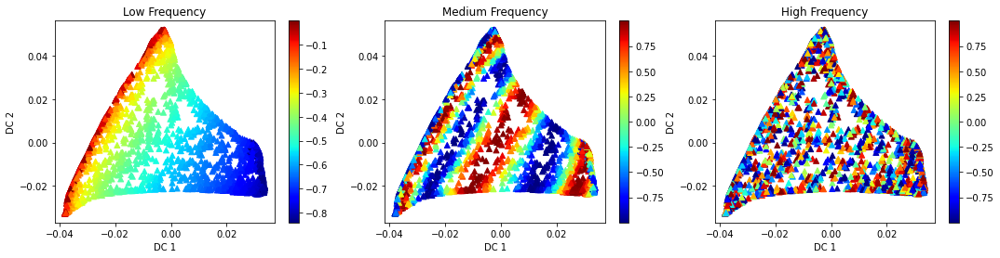

In [192]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

scat = axes[0].scatter(diff_map[:, 0], diff_map[:, 1], c = low_freq_shift, cmap = my_cmap, marker ='^')
axes[0].set_title('Low Frequency')
axes[0].set_xlabel(f'DC {1}')
axes[0].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[0])

scat = axes[1].scatter(diff_map[:, 0], diff_map[:, 1], c = med_freq_shift, cmap = my_cmap, marker ='^')
axes[1].set_title('Medium Frequency')
axes[1].set_xlabel(f'DC {1}')
axes[1].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[1])

scat = axes[2].scatter(diff_map[:, 0], diff_map[:, 1], c = hig_freq_shift, cmap = my_cmap, marker ='^')
axes[2].set_title('High Frequency')
axes[2].set_xlabel(f'DC {1}')
axes[2].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[2])

plt.show()

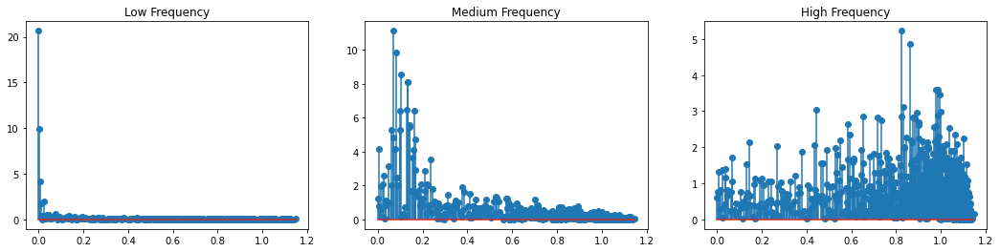

In [193]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

axes[0].set_title(f'Low Frequency')
axes[0].stem(eval_swiss, s_low_freq_shift, linefmt=None, markerfmt=None, basefmt=None)

axes[1].set_title(f'Medium Frequency')
axes[1].stem(eval_swiss, s_med_freq_shift, linefmt=None, markerfmt=None, basefmt=None)

axes[2].set_title(f'High Frequency')
axes[2].stem(eval_swiss, s_hig_freq_shift, linefmt=None, markerfmt=None, basefmt=None)

plt.show()

In [194]:
s_lowfreq_LPfil = H_LPfilter_swiss @ low_freq
s_medfreq_LPfil = H_LPfilter_swiss @ med_freq
s_higfreq_LPfil = H_LPfilter_swiss @ hig_freq

s_hat_lowfreq_LPfil = abs(gft(s_lowfreq_LPfil, evec_swiss))
s_hat_medfreq_LPfil = abs(gft(s_medfreq_LPfil, evec_swiss))
s_hat_higfreq_LPfil = abs(gft(s_higfreq_LPfil, evec_swiss))

s_lowfreq_HPfil = H_HPfilter_swiss @ low_freq
s_medfreq_HPfil = H_HPfilter_swiss @ med_freq
s_higfreq_HPfil = H_HPfilter_swiss @ hig_freq

s_hat_lowfreq_HPfil = abs(gft(s_lowfreq_HPfil, evec_swiss))
s_hat_medfreq_HPfil = abs(gft(s_medfreq_HPfil, evec_swiss))
s_hat_higfreq_HPfil = abs(gft(s_higfreq_HPfil, evec_swiss))

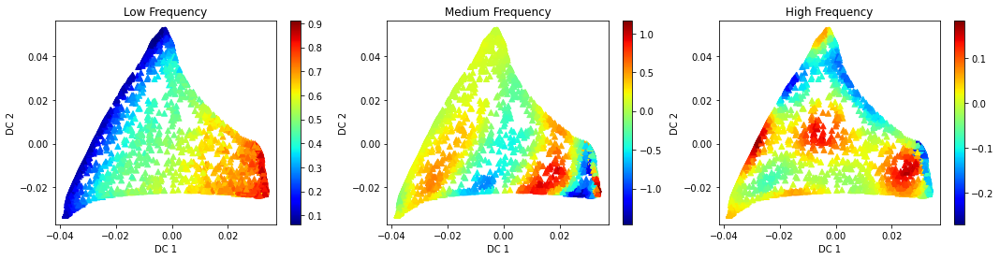

In [195]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

scat = axes[0].scatter(diff_map[:, 0], diff_map[:, 1], c = s_lowfreq_LPfil, cmap = my_cmap, marker ='^')
axes[0].set_title('Low Frequency')
axes[0].set_xlabel(f'DC {1}')
axes[0].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[0])

scat = axes[1].scatter(diff_map[:, 0], diff_map[:, 1], c = s_medfreq_LPfil, cmap = my_cmap, marker ='^')
axes[1].set_title('Medium Frequency')
axes[1].set_xlabel(f'DC {1}')
axes[1].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[1])

scat = axes[2].scatter(diff_map[:, 0], diff_map[:, 1], c = s_higfreq_LPfil, cmap = my_cmap, marker ='^')
axes[2].set_title('High Frequency')
axes[2].set_xlabel(f'DC {1}')
axes[2].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[2])

plt.show()

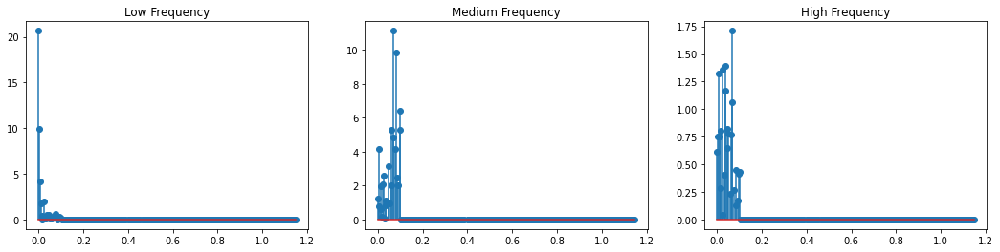

In [196]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

axes[0].set_title(f'Low Frequency')
axes[0].stem(eval_swiss, s_hat_lowfreq_LPfil, linefmt=None, markerfmt=None, basefmt=None)

axes[1].set_title(f'Medium Frequency')
axes[1].stem(eval_swiss, s_hat_medfreq_LPfil, linefmt=None, markerfmt=None, basefmt=None)

axes[2].set_title(f'High Frequency')
axes[2].stem(eval_swiss, s_hat_higfreq_LPfil, linefmt=None, markerfmt=None, basefmt=None)

plt.show()

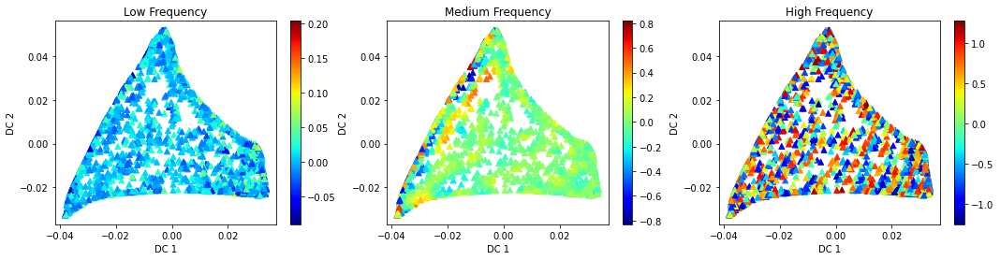

In [197]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

scat = axes[0].scatter(diff_map[:, 0], diff_map[:, 1], c = s_lowfreq_HPfil, cmap = my_cmap, marker ='^')
axes[0].set_title('Low Frequency')
axes[0].set_xlabel(f'DC {1}')
axes[0].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[0])

scat = axes[1].scatter(diff_map[:, 0], diff_map[:, 1], c = s_medfreq_HPfil, cmap = my_cmap, marker ='^')
axes[1].set_title('Medium Frequency')
axes[1].set_xlabel(f'DC {1}')
axes[1].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[1])

scat = axes[2].scatter(diff_map[:, 0], diff_map[:, 1], c = s_higfreq_HPfil, cmap = my_cmap, marker ='^')
axes[2].set_title('High Frequency')
axes[2].set_xlabel(f'DC {1}')
axes[2].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[2])

plt.show()

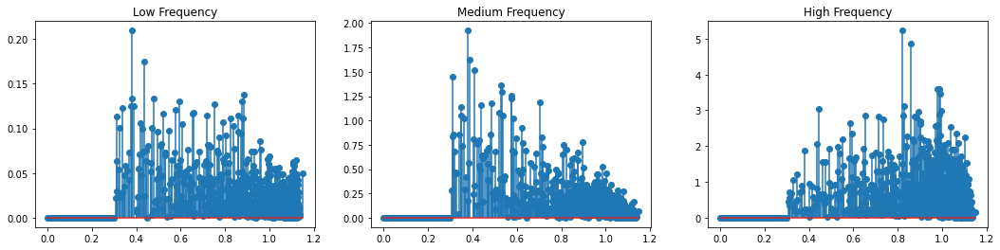

In [198]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

axes[0].set_title(f'Low Frequency')
axes[0].stem(eval_swiss, s_hat_lowfreq_HPfil, linefmt=None, markerfmt=None, basefmt=None)

axes[1].set_title(f'Medium Frequency')
axes[1].stem(eval_swiss, s_hat_medfreq_HPfil, linefmt=None, markerfmt=None, basefmt=None)

axes[2].set_title(f'High Frequency')
axes[2].stem(eval_swiss, s_hat_higfreq_HPfil, linefmt=None, markerfmt=None, basefmt=None)

plt.show()

In [253]:
W_44 = gaussian_kernel(swissPoints, kernel_type = "adaptive", k=10)
diff_vec_44, diff_eig_44 = diff_map_info(W_44)
diff_map_44 = get_diff_map(diff_vec_44, diff_eig_44, 1)

adaptive bandwidth specified


In [254]:
#Creating the labels with the kronecker delta function
label_uno = get_kron(int(swissLabels.shape[0]/4),swissLabels.shape[0])
label_dos = get_kron(int(swissLabels.shape[0]/2),swissLabels.shape[0])
label_tres = get_kron(int(3*swissLabels.shape[0]/4),swissLabels.shape[0])

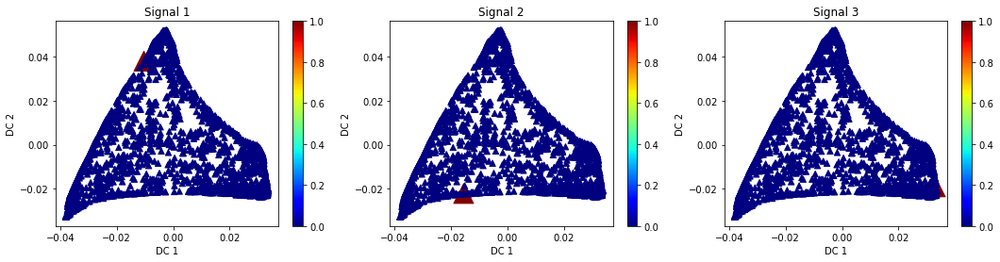

In [255]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

scat = axes[0].scatter(diff_map[:, 0], diff_map[:, 1], c = label_uno, cmap = my_cmap, marker ='^', s = 400 * (label_uno+0.1))
axes[0].set_title('Signal 1')
axes[0].set_xlabel(f'DC {1}')
axes[0].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[0])

scat = axes[1].scatter(diff_map[:, 0], diff_map[:, 1], c = label_dos, cmap = my_cmap, marker ='^', s = 400 * (label_dos+0.1))
axes[1].set_title('Signal 2')
axes[1].set_xlabel(f'DC {1}')
axes[1].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[1])

scat = axes[2].scatter(diff_map[:, 0], diff_map[:, 1], c = label_tres, cmap = my_cmap, marker ='^', s = 400 * (label_tres+0.1))
axes[2].set_title('Signal 3')
axes[2].set_xlabel(f'DC {1}')
axes[2].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[2])

plt.show()

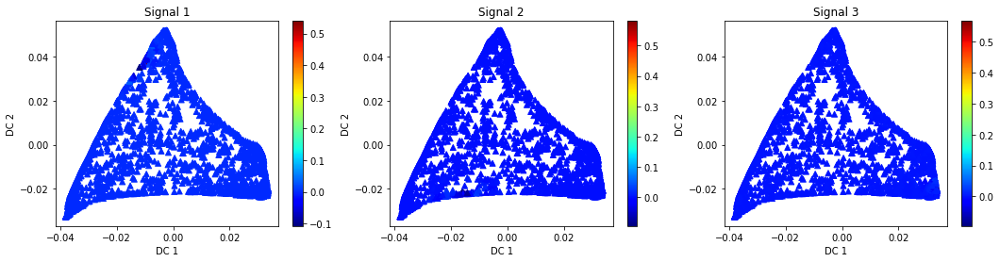

In [270]:
mu = 0.001
sigma = 0.1
H_44a = filterbank_matrix(diff_vec_44, diff_eig_44, lambda x: np.exp((-(x - mu)**2)/(2*(sigma**2))))

label_uno_filtered = H_44a @ label_uno
label_dos_filtered = H_44a @ label_dos
label_tres_filtered = H_44a @ label_tres

fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

scat = axes[0].scatter(diff_map[:, 0], diff_map[:, 1], c = label_uno_filtered, cmap = my_cmap, marker ='^')
axes[0].set_title('Signal 1')
axes[0].set_xlabel(f'DC {1}')
axes[0].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[0])

scat = axes[1].scatter(diff_map[:, 0], diff_map[:, 1], c = label_dos_filtered, cmap = my_cmap, marker ='^')
axes[1].set_title('Signal 2')
axes[1].set_xlabel(f'DC {1}')
axes[1].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[1])

scat = axes[2].scatter(diff_map[:, 0], diff_map[:, 1], c = label_tres_filtered, cmap = my_cmap, marker ='^')
axes[2].set_title('Signal 3')
axes[2].set_xlabel(f'DC {1}')
axes[2].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[2])

plt.show()

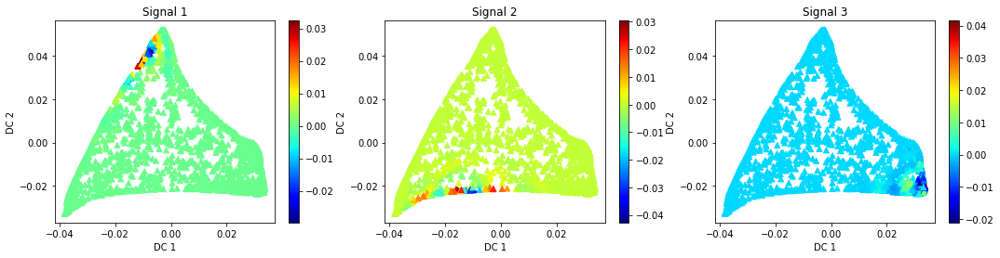

In [214]:
mu = 0.5
sigma = 0.1
H_44a = filterbank_matrix(diff_vec_44, diff_eig_44, lambda x: np.exp((-(x - mu)**2)/(2*(sigma**2))))

label_uno_filtered = H_44a @ label_uno
label_dos_filtered = H_44a @ label_dos
label_tres_filtered = H_44a @ label_tres

fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

scat = axes[0].scatter(diff_map[:, 0], diff_map[:, 1], c = label_uno_filtered, cmap = my_cmap, marker ='^')
axes[0].set_title('Signal 1')
axes[0].set_xlabel(f'DC {1}')
axes[0].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[0])

scat = axes[1].scatter(diff_map[:, 0], diff_map[:, 1], c = label_dos_filtered, cmap = my_cmap, marker ='^')
axes[1].set_title('Signal 2')
axes[1].set_xlabel(f'DC {1}')
axes[1].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[1])

scat = axes[2].scatter(diff_map[:, 0], diff_map[:, 1], c = label_tres_filtered, cmap = my_cmap, marker ='^')
axes[2].set_title('Signal 3')
axes[2].set_xlabel(f'DC {1}')
axes[2].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[2])

plt.show()

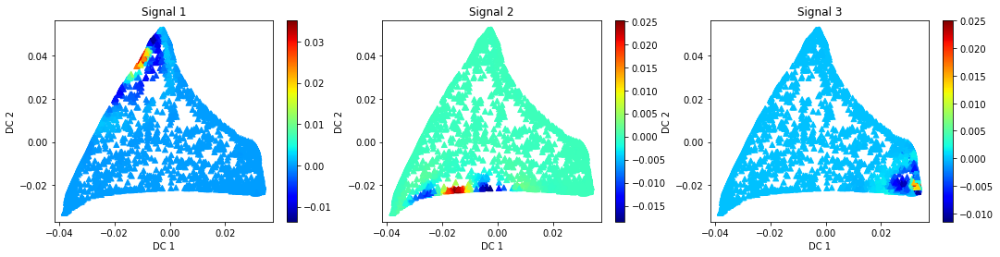

In [215]:
mu = 0.8
sigma = 0.1
H_44a = filterbank_matrix(diff_vec_44, diff_eig_44, lambda x: np.exp((-(x - mu)**2)/(2*(sigma**2))))

label_uno_filtered = H_44a @ label_uno
label_dos_filtered = H_44a @ label_dos
label_tres_filtered = H_44a @ label_tres

fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

scat = axes[0].scatter(diff_map[:, 0], diff_map[:, 1], c = label_uno_filtered, cmap = my_cmap, marker ='^')
axes[0].set_title('Signal 1')
axes[0].set_xlabel(f'DC {1}')
axes[0].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[0])

scat = axes[1].scatter(diff_map[:, 0], diff_map[:, 1], c = label_dos_filtered, cmap = my_cmap, marker ='^')
axes[1].set_title('Signal 2')
axes[1].set_xlabel(f'DC {1}')
axes[1].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[1])

scat = axes[2].scatter(diff_map[:, 0], diff_map[:, 1], c = label_tres_filtered, cmap = my_cmap, marker ='^')
axes[2].set_title('Signal 3')
axes[2].set_xlabel(f'DC {1}')
axes[2].set_ylabel(f'DC {2}')
plt.colorbar(scat,ax=axes[2])

plt.show()

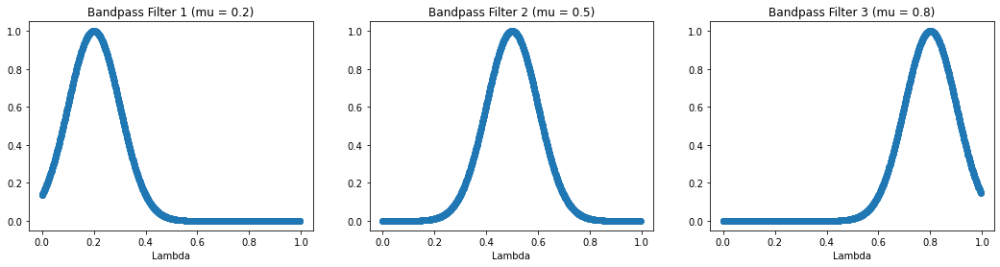

In [218]:
x_lambda = np.linspace(0,np.max(diff_eig_44),1000)
mu3 = np.exp((-(x_lambda - 0.2)**2)/(2*(0.1**2)))
mu5 = np.exp((-(x_lambda - 0.5)**2)/(2*(0.1**2)))
mu7 = np.exp((-(x_lambda - 0.8)**2)/(2*(0.1**2)))

fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

scat = axes[0].scatter(x_lambda, mu3)
axes[0].set_title('Bandpass Filter 1 (mu = 0.2)')
axes[0].set_xlabel(f'Lambda')

scat = axes[1].scatter(x_lambda, mu5)
axes[1].set_title('Bandpass Filter 2 (mu = 0.5)')
axes[1].set_xlabel(f'Lambda')

scat = axes[2].scatter(x_lambda, mu7)
axes[2].set_title('Bandpass Filter 3 (mu = 0.8)')
axes[2].set_xlabel(f'Lambda')

plt.show()

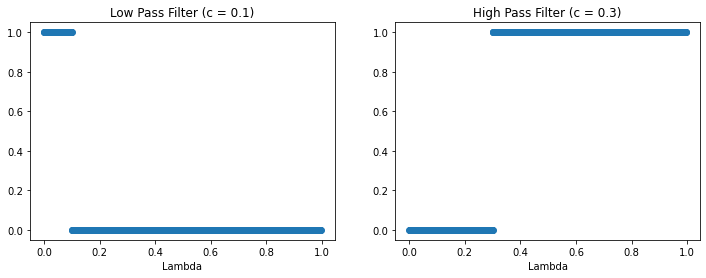

In [217]:
x_lambda = np.linspace(0,np.max(diff_eig_44),1000)
mu3 = (x_lambda<0.1).astype(int)
mu5 = (x_lambda>0.3).astype(int)

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 4))
axes = axes.ravel()

scat = axes[0].scatter(x_lambda, mu3)
axes[0].set_title('Low Pass Filter (c = 0.1)')
axes[0].set_xlabel(f'Lambda')

scat = axes[1].scatter(x_lambda, mu5)
axes[1].set_title('High Pass Filter (c = 0.3)')
axes[1].set_xlabel(f'Lambda')

plt.show()

# 5) k-means Clustering

In [574]:
def kmeans(X, k, nrep=5, itermax=300):
    """kmeans: cluster data into k partitions

    Args:
        X (n x d np.ndarray): input data, rows = points, cols = dimensions
        k (int): Number of clusters to partition
        nrep (int): Number of repetitions to average for final clustering 
        itermax (int): Number of iterations to perform before terminating
    Returns:
        labels (n x 1 np.ndarray): Cluster labels assigned by kmeans
    """
    n = X.shape[0]
    possible_labels = np.zeros((nrep,n))
    min_wcd = np.zeros(nrep)

    # Do a for loop for different initializations
    for reps in np.arange(nrep):
        labels = np.zeros(n)
        init = kmeans_plusplus(X, k)  # find your initial centroids
        d_init = 100
        num = 0

        while (d_init > 0.000001 and num != itermax):
            init_prev = init

            for i in np.arange(n):
                min_vec = []
                for j in np.arange(k):
                    min_vec.append(np.sqrt(np.sum(np.square(X[i,:]-init[j,:]))))
                labels[i] = np.argmin(min_vec)

            for i in np.arange(k):
                X_sep = X[labels == i,:]
                init[i,:] = np.mean(X_sep, axis = 0)

            d_init = np.sqrt(np.sum(np.square(init-init_prev))) / np.sqrt(np.sum(np.square(init_prev)))
            num += 1
        
    
        sumat = 0

        for i in np.arange(n):
            cluster_nr = labels[i].astype(int)
            sumat += np.sqrt(np.sum(np.square(X[i,:]-init[cluster_nr,:])))

        min_wcd[reps] = sumat
        possible_labels[reps] = labels
    
    #Big for loop is finished, we now want the labels with the smallest distance to center
    labels = possible_labels[np.argmin(min_wcd)]
    return labels

In [575]:
def kmeans_plusplus(X, k):
    """kmeans_plusplus: initialization algorithm for kmeans
    Args:
        X (n x d np.ndarray): input data, rows = points, cols = dimensions
        k (int): Number of clusters to partition

    Returns:
        centroids (k x d np.ndarray): centroids for initializing k-means
    """
    n = X.shape[0]
    d = X.shape[1]
    centroids = np.zeros((k, d))
    centroids[0,:] = X[np.random.randint(n),:]
    
    for clus in np.arange(1,k):
        
        # Create the vector with shortest squared distances
        dis_vec = np.zeros(n)
        for i in np.arange(n):
            min_vec = []
            for j in np.arange(clus):
                min_vec.append(np.sum(np.square(X[i,:]-centroids[j,:])))
            dis_vec[i] = np.min(min_vec)
        sum_sq_dis = np.sum(dis_vec)
        prob_points = dis_vec / sum_sq_dis 
                               
        # Sample a new point  
        indice = np.random.choice(np.arange(n), p=prob_points)
        centroids[clus,:] = X[indice,:]
    return centroids

In [414]:
xx, yy, GMM_0_0025 = sbm(500, 8, 0.60, 0.65, sigma = 0.0025)
labels_gauss_0_0025 = kmeans(GMM_0_0025, 8, nrep=5, itermax=300)

In [415]:
xx, yy, GMM_0_1 = sbm(500, 8, 0.60, 0.65, sigma = 0.01)
labels_gauss_0_1 = kmeans(GMM_0_1, 8, nrep=5, itermax=300)

In [416]:
xx, yy, GMM_0_2 = sbm(500, 8, 0.60, 0.65, sigma = 0.04)
labels_gauss_0_2 = kmeans(GMM_0_2, 8, nrep=5, itermax=300)

In [417]:
xx, yy, GMM_0_3 = sbm(500, 8, 0.60, 0.65, sigma = 0.09)
labels_gauss_0_3 = kmeans(GMM_0_3, 8, nrep=5, itermax=300)

In [418]:
xx, yy, GMM_0_16 = sbm(500, 8, 0.60, 0.65, sigma = 0.16)
labels_gauss_0_16 = kmeans(GMM_0_16, 8, nrep=5, itermax=300)

In [419]:
xx, yy, GMM_0_36 = sbm(500, 8, 0.60, 0.65, sigma = 0.36)
labels_gauss_0_36 = kmeans(GMM_0_36, 8, nrep=5, itermax=300)

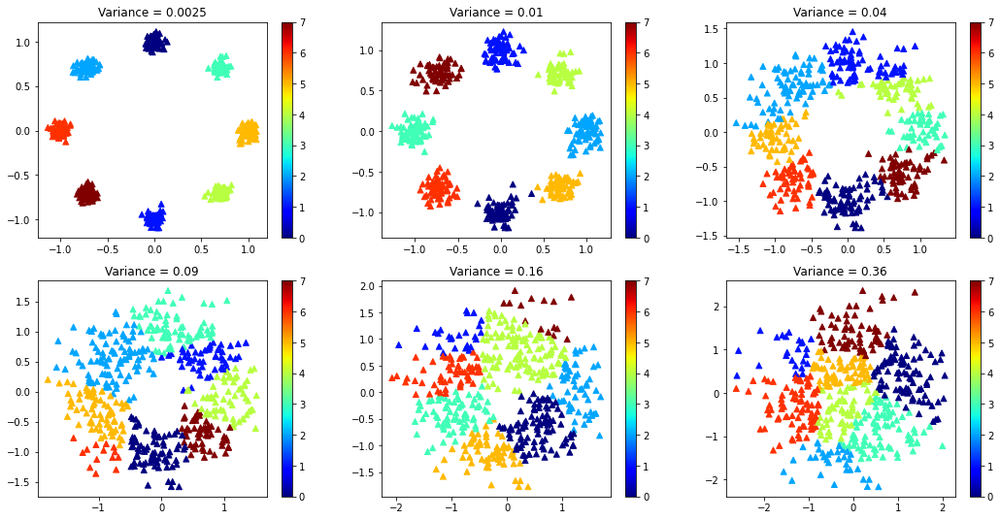

In [420]:
f, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (18,9))
axes = axes.ravel()

scat = axes[0].scatter(GMM_0_0025[:,0], GMM_0_0025[:,1], c = labels_gauss_0_0025, cmap = my_cmap, marker ='^')
axes[0].set_title(f'Variance = 0.0025')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(GMM_0_1[:,0], GMM_0_1[:,1], c = labels_gauss_0_1, cmap = my_cmap, marker ='^')
axes[1].set_title(f'Variance = 0.01')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(GMM_0_2[:,0], GMM_0_2[:,1], c = labels_gauss_0_2, cmap = my_cmap, marker ='^')
axes[2].set_title(f'Variance = 0.04')
plt.colorbar(scat, ax = axes[2])

scat = axes[3].scatter(GMM_0_3[:,0], GMM_0_3[:,1], c = labels_gauss_0_3, cmap = my_cmap, marker ='^')
axes[3].set_title(f'Variance = 0.09')
plt.colorbar(scat, ax = axes[3])

scat = axes[4].scatter(GMM_0_16[:,0], GMM_0_16[:,1], c = labels_gauss_0_16, cmap = my_cmap, marker ='^')
axes[4].set_title(f'Variance = 0.16')
plt.colorbar(scat, ax = axes[4])

scat = axes[5].scatter(GMM_0_36[:,0], GMM_0_36[:,1], c = labels_gauss_0_36, cmap = my_cmap, marker ='^')
axes[5].set_title(f'Variance = 0.36')
plt.colorbar(scat, ax = axes[5])

plt.show()

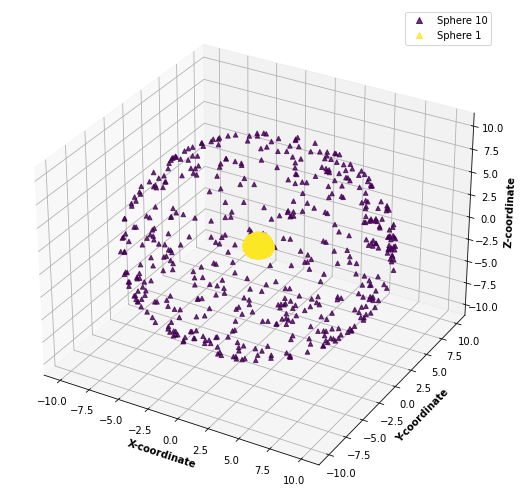

In [228]:
n = 1000

Sphere_matrix = np.zeros((n,3))
Sphere_labels = np.concatenate((np.zeros(int(n/2)), np.ones(int(n/2))))

Sphere_matrix[:,0] = np.random.normal(0,1, n)
Sphere_matrix[:,1] = np.random.normal(0,1, n)
Sphere_matrix[:,2] = np.random.normal(0,1, n)

for i in np.arange(n):
    norm = np.sqrt(np.sum(np.square(Sphere_matrix[i,:])))
    Sphere_matrix[i,:] = Sphere_matrix[i,:] / norm
    
Sphere_matrix[0:int(n/2),:] = Sphere_matrix[0:int(n/2),:] * 10
    
x = Sphere_matrix[:,0]
y = Sphere_matrix[:,1]
z = Sphere_matrix[:,2]

fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")

ax.grid(b = True, color ='grey',linestyle ='-.', linewidth = 0.3, alpha = 0.2)
 
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = Sphere_labels,
                    marker ='^')
 
#plt.title("3D scatter plot of the mean centered data")
ax.set_xlabel('X-coordinate', fontweight ='bold')
ax.set_ylabel('Y-coordinate', fontweight ='bold')
ax.set_zlabel('Z-coordinate', fontweight ='bold')
plt.legend(handles=sctt.legend_elements()[0], labels=["Sphere 10","Sphere 1"])

plt.show()

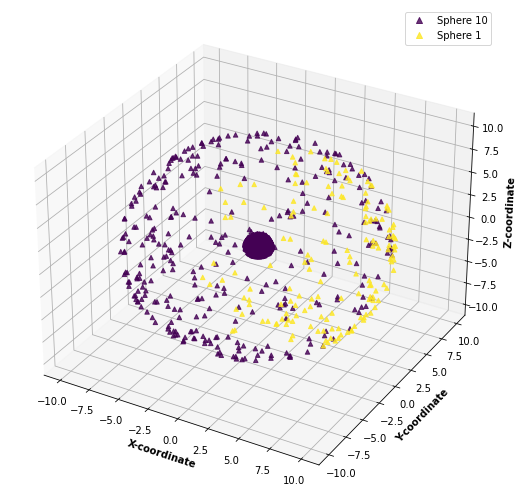

In [229]:
labels_kmeans_sphere = kmeans(Sphere_matrix, 2, nrep=5, itermax=300)

fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")

ax.grid(b = True, color ='grey',linestyle ='-.', linewidth = 0.3, alpha = 0.2)
 
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = labels_kmeans_sphere,
                    marker ='^')
 
#plt.title("3D scatter plot of the mean centered data")
ax.set_xlabel('X-coordinate', fontweight ='bold')
ax.set_ylabel('Y-coordinate', fontweight ='bold')
ax.set_zlabel('Z-coordinate', fontweight ='bold')
plt.legend(handles=sctt.legend_elements()[0], labels=["Sphere 10","Sphere 1"])

plt.show()

# 6) Spectral Clustering

In [576]:
def SC(L, k, psi=None, nrep=5, itermax=300, sklearn=False):
    """SC: Perform spectral clustering 
            via the Ng method
    Args:
        L (np.ndarray): Normalized graph Laplacian
        k (integer): number of clusters to compute
        nrep (int): Number of repetitions to average for final clustering
        itermax (int): Number of iterations to perform before terminating
        sklearn (boolean): Flag to use sklearn kmeans to test your algorithm
    Returns:
        labels (N x 1 np.array): Learned cluster labels
    """
    if psi is None:
        # compute the first k elements of the Fourier basis
        # use scipy.linalg.eigh
        evalues, evectors = np.linalg.eigh(L)
        indices = np.argsort(evalues)
        e = evalues[indices]
        psi = evectors[indices]
        psi_k = psi[:, :k]
        pass
    else:  # just grab the first k eigenvectors
        psi_k = psi[:, :k]

    # normalize your eigenvector rows
    n = psi_k.shape[0]
    for i in np.arange(n):
        norm = np.sqrt(np.sum(np.square(psi_k[i,:])))
        psi_k[i,:] = psi_k[i,:] / norm
        
    psi_norm = psi_k

    if sklearn:
        labels = KMeans(n_clusters=k, n_init=nrep,
                        max_iter=itermax).fit_predict(psi_norm)
    else:
        pass
        labels = kmeans(psi_norm, k, nrep, itermax)

    return labels


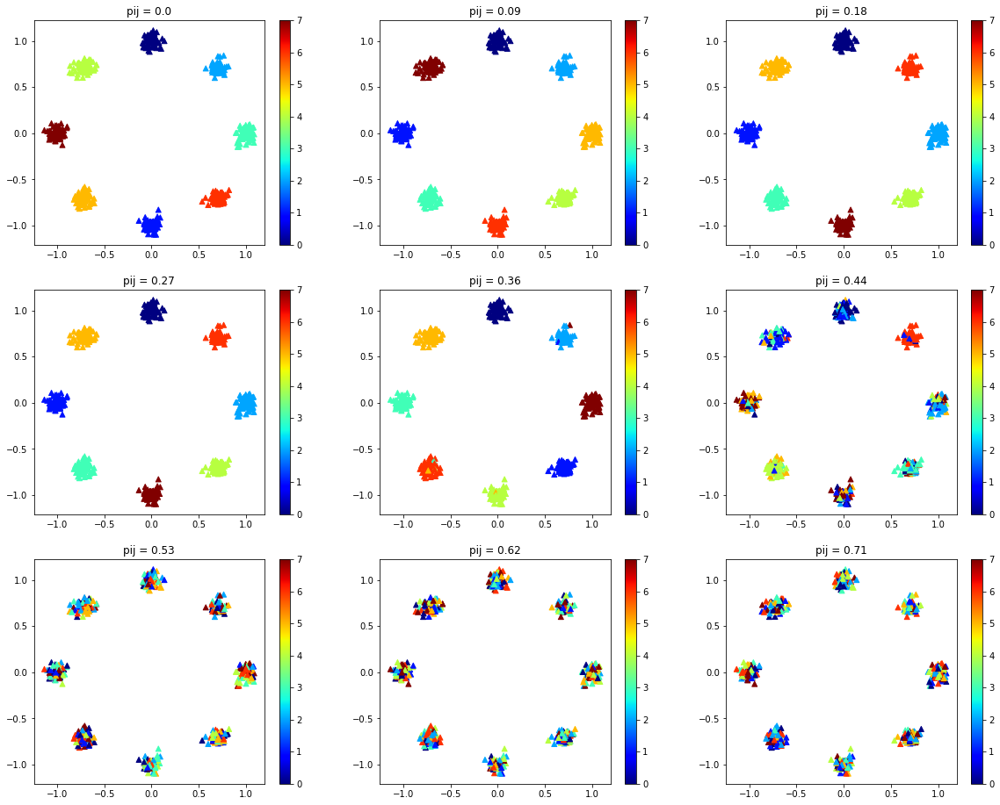

In [231]:
# We see that for different values of sigma, the clusters start to suck if pij>0.5
sigm = 0.0025
mn = 3
fig, axes = plt.subplots(nrows = mn, ncols = mn, figsize = (20, 16))
axes = axes.ravel()
num = 0

my_cmap = plt.get_cmap('jet')

for i in np.arange(0,mn*mn):
    Adj, gtruth, coordsBlobs = sbm(500, 8, i*(0.80/(mn*mn)), 0.65, sigm)
    Ls_61 = L(Adj, normalized=True)
    labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=True)
    scat = axes[num].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
    axes[num].set_title(f'pij = {round(i*(0.80/(mn*mn)),2)}')
    plt.colorbar(scat, ax = axes[num])
    num += 1

plt.show()

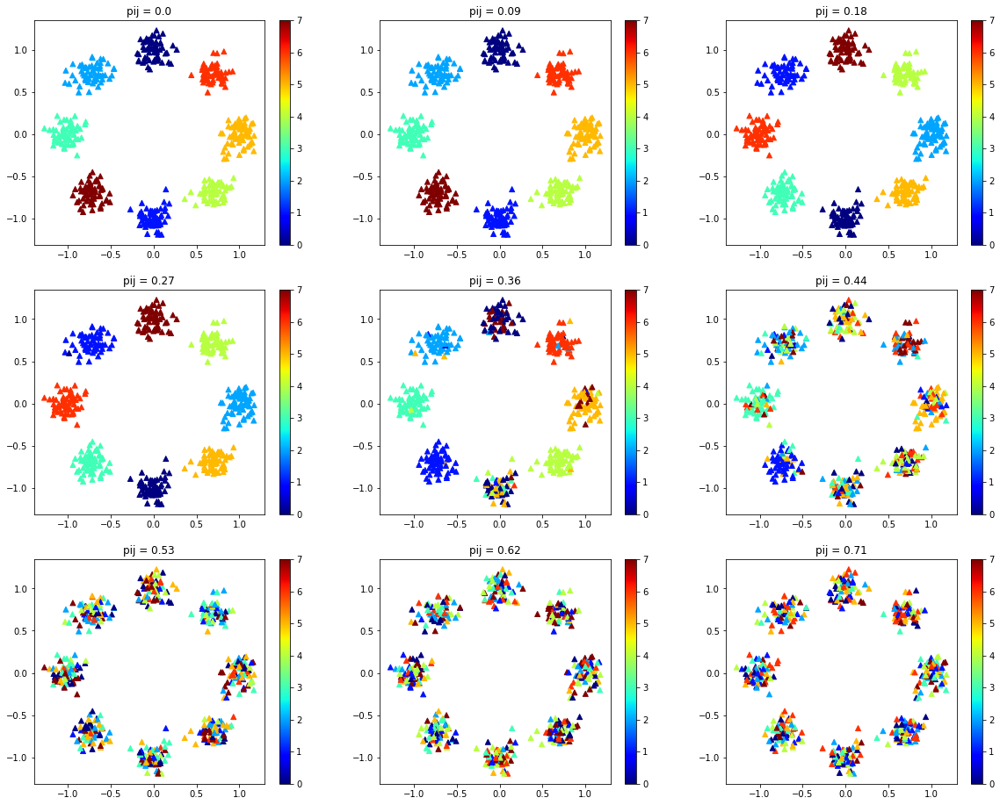

In [232]:
sigm = 0.01
mn = 3
fig, axes = plt.subplots(nrows = mn, ncols = mn, figsize = (20, 16))
axes = axes.ravel()
num = 0

my_cmap = plt.get_cmap('jet')

for i in np.arange(0,mn*mn):
    Adj, gtruth, coordsBlobs = sbm(500, 8, i*(0.80/(mn*mn)), 0.65, sigm)
    Ls_61 = L(Adj, normalized=True)
    labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
    scat = axes[num].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
    axes[num].set_title(f'pij = {round(i*(0.80/(mn*mn)),2)}')
    plt.colorbar(scat, ax = axes[num])
    num += 1

plt.show()

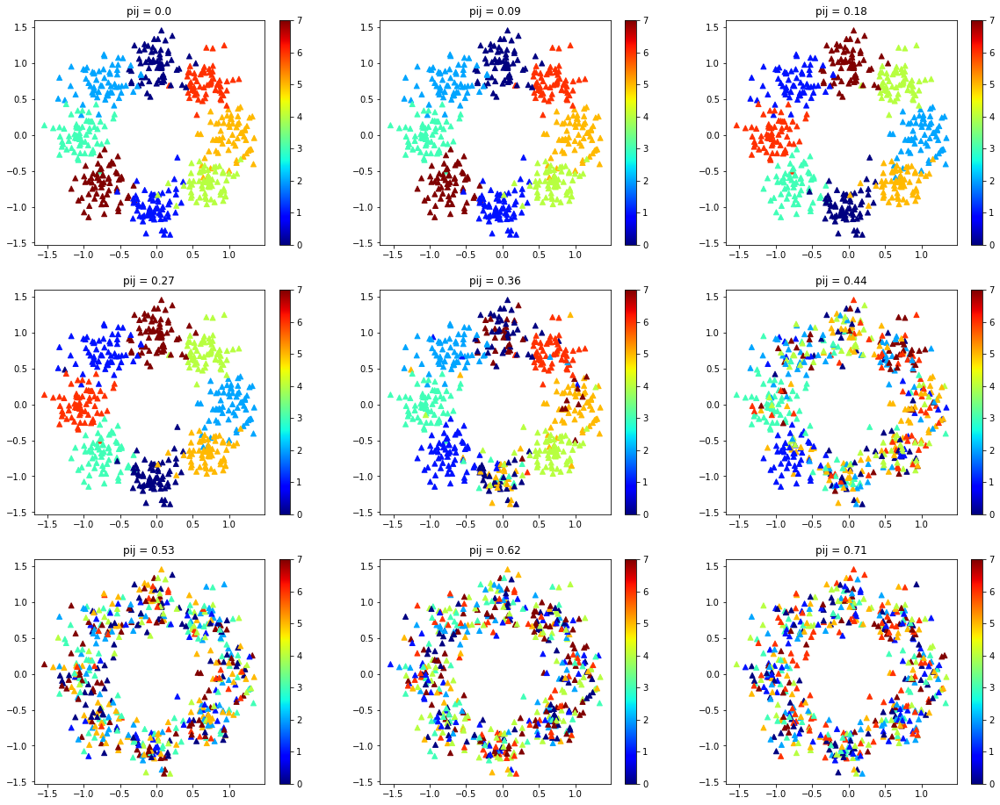

In [233]:
sigm = 0.04
mn = 3
fig, axes = plt.subplots(nrows = mn, ncols = mn, figsize = (20, 16))
axes = axes.ravel()
num = 0

my_cmap = plt.get_cmap('jet')

for i in np.arange(0,mn*mn):
    Adj, gtruth, coordsBlobs = sbm(500, 8, i*(0.80/(mn*mn)), 0.65, sigm)
    Ls_61 = L(Adj, normalized=True)
    labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
    scat = axes[num].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
    axes[num].set_title(f'pij = {round(i*(0.80/(mn*mn)),2)}')
    plt.colorbar(scat, ax = axes[num])
    num += 1

plt.show()

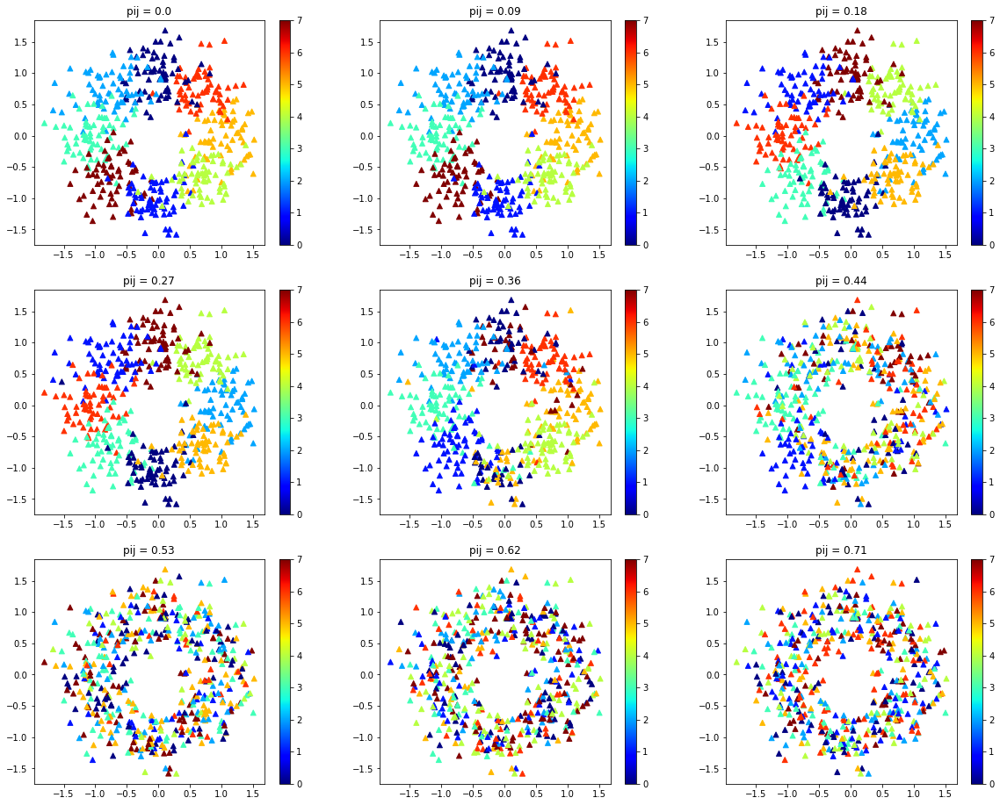

In [234]:
sigm = 0.09
mn = 3
fig, axes = plt.subplots(nrows = mn, ncols = mn, figsize = (20, 16))
axes = axes.ravel()
num = 0

my_cmap = plt.get_cmap('jet')

for i in np.arange(0,mn*mn):
    Adj, gtruth, coordsBlobs = sbm(500, 8, i*(0.80/(mn*mn)), 0.65, sigm)
    Ls_61 = L(Adj, normalized=True)
    labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
    scat = axes[num].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
    axes[num].set_title(f'pij = {round(i*(0.80/(mn*mn)),2)}')
    plt.colorbar(scat, ax = axes[num])
    num += 1

plt.show()

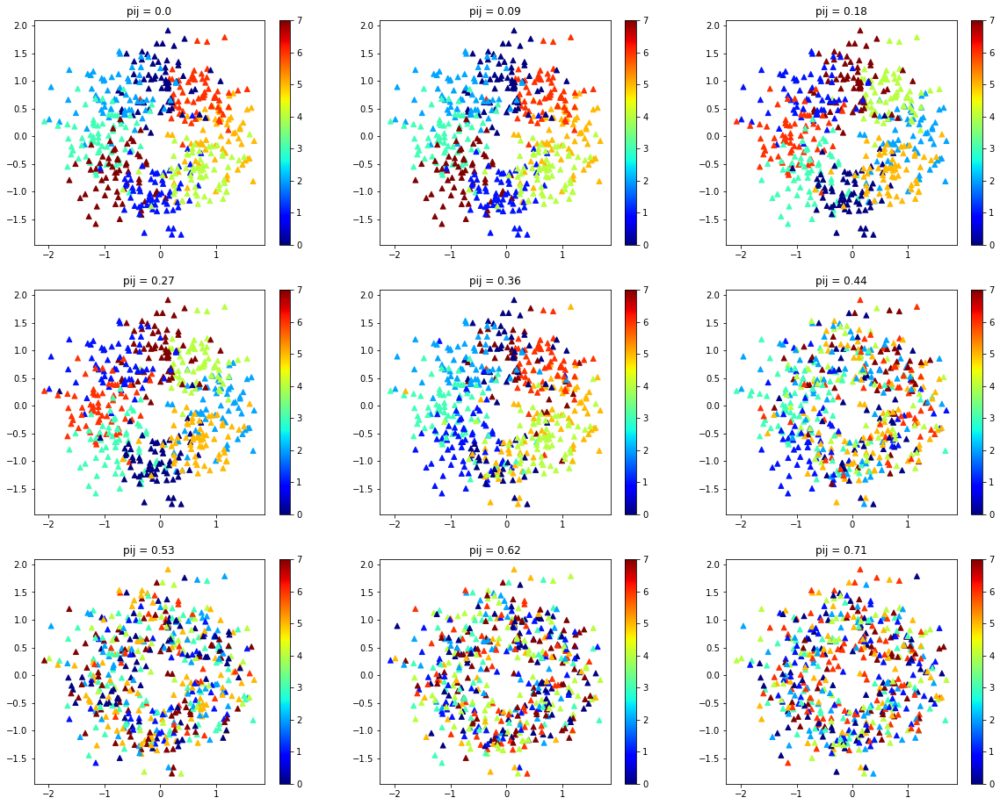

In [235]:
sigm = 0.16
mn = 3
fig, axes = plt.subplots(nrows = mn, ncols = mn, figsize = (20, 16))
axes = axes.ravel()
num = 0

my_cmap = plt.get_cmap('jet')

for i in np.arange(0,mn*mn):
    Adj, gtruth, coordsBlobs = sbm(500, 8, i*(0.80/(mn*mn)), 0.65, sigm)
    Ls_61 = L(Adj, normalized=True)
    labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
    scat = axes[num].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
    axes[num].set_title(f'pij = {round(i*(0.80/(mn*mn)),2)}')
    plt.colorbar(scat, ax = axes[num])
    num += 1

plt.show()

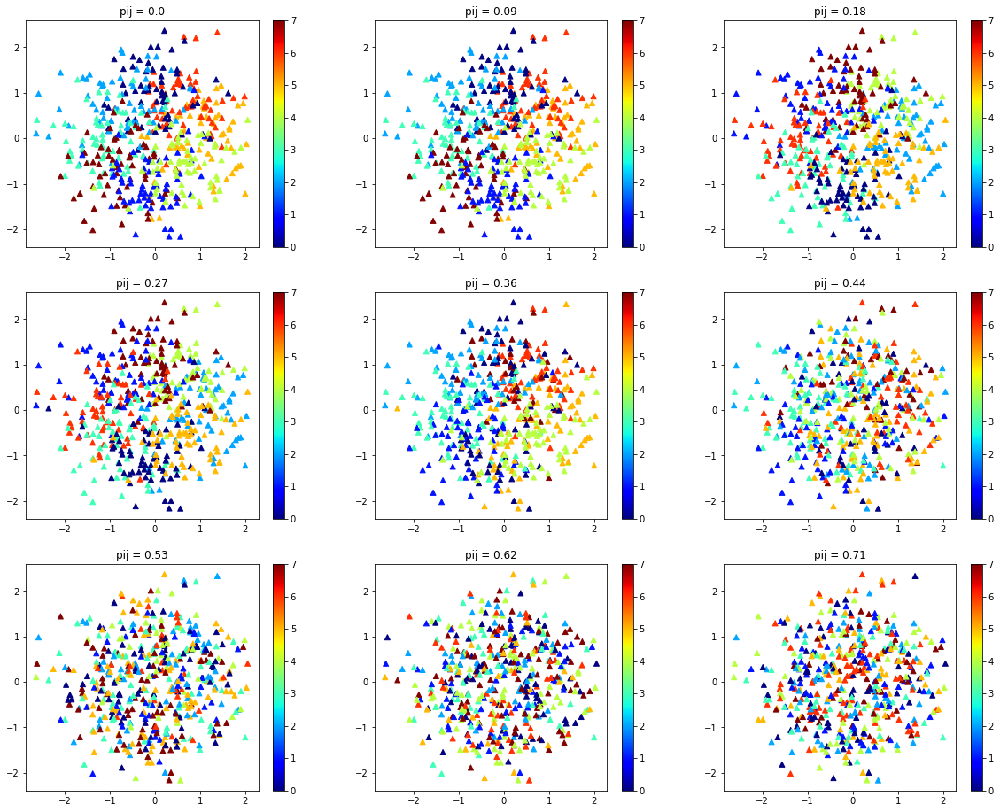

In [236]:
sigm = 0.36
mn = 3
fig, axes = plt.subplots(nrows = mn, ncols = mn, figsize = (20, 16))
axes = axes.ravel()
num = 0

my_cmap = plt.get_cmap('jet')

for i in np.arange(0,mn*mn):
    Adj, gtruth, coordsBlobs = sbm(500, 8, i*(0.80/(mn*mn)), 0.65, sigm)
    Ls_61 = L(Adj, normalized=True)
    labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
    scat = axes[num].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
    axes[num].set_title(f'pij = {round(i*(0.80/(mn*mn)),2)}')
    plt.colorbar(scat, ax = axes[num])
    num += 1

plt.show()

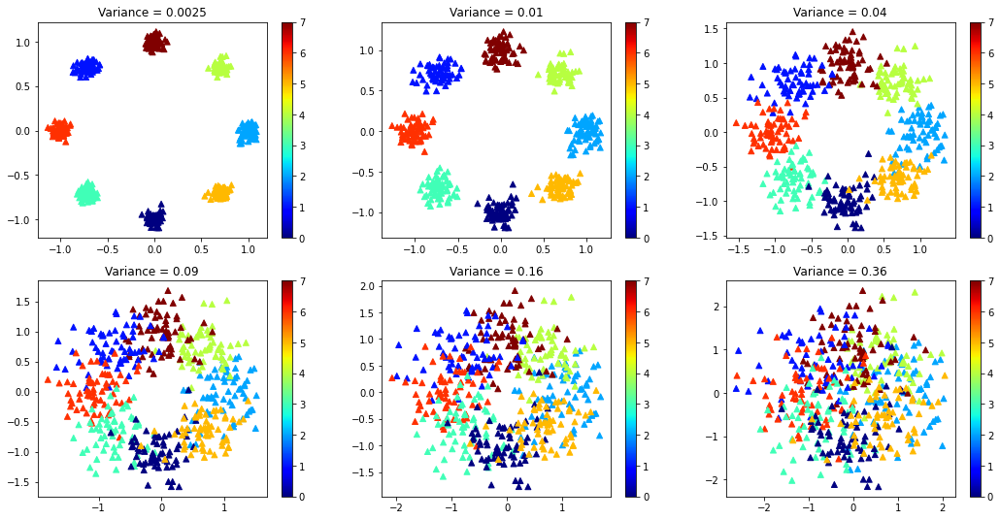

In [237]:
f, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (18,9))
axes = axes.ravel()


sigma= 0.0025
Adj, gtruth, coordsBlobs = sbm(500, 8, 0.25, 0.65, sigma)
Ls_61 = L(Adj, normalized=True)
labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
scat = axes[0].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
axes[0].set_title(f'Variance = {sigma}')
plt.colorbar(scat, ax = axes[0])

sigma= 0.01
Adj, gtruth, coordsBlobs = sbm(500, 8, 0.25, 0.65, sigma)
Ls_61 = L(Adj, normalized=True)
labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
scat = axes[1].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
axes[1].set_title(f'Variance = {sigma}')
plt.colorbar(scat, ax = axes[1])

sigma= 0.04
Adj, gtruth, coordsBlobs = sbm(500, 8, 0.25, 0.65, sigma)
Ls_61 = L(Adj, normalized=True)
labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
scat = axes[2].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
axes[2].set_title(f'Variance = {sigma}')
plt.colorbar(scat, ax = axes[2])

sigma= 0.09
Adj, gtruth, coordsBlobs = sbm(500, 8, 0.25, 0.65, sigma)
Ls_61 = L(Adj, normalized=True)
labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
scat = axes[3].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
axes[3].set_title(f'Variance = {sigma}')
plt.colorbar(scat, ax = axes[3])

sigma= 0.16
Adj, gtruth, coordsBlobs = sbm(500, 8, 0.25, 0.65, sigma)
Ls_61 = L(Adj, normalized=True)
labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
scat = axes[4].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
axes[4].set_title(f'Variance = {sigma}')
plt.colorbar(scat, ax = axes[4])

sigma= 0.36
Adj, gtruth, coordsBlobs = sbm(500, 8, 0.25, 0.65, sigma)
Ls_61 = L(Adj, normalized=True)
labels_61 = SC(Ls_61, 8, psi=None, nrep=5, itermax=300, sklearn=False)
scat = axes[5].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = labels_61, cmap = my_cmap, marker ='^')
axes[5].set_title(f'Variance = {sigma}')
plt.colorbar(scat, ax = axes[5])

plt.show()

fixed bandwidth specified


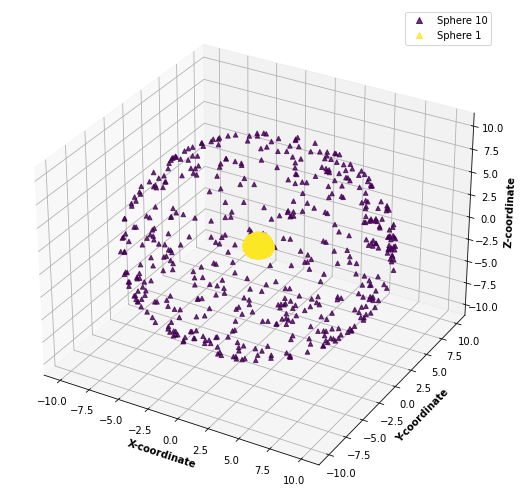

In [238]:
W = gaussian_kernel(Sphere_matrix, kernel_type="gaussian", sigma=3.0, k=5)
lapl = L(W, normalized=True)

labels_kmeans_sphere = SC(lapl, 2, psi=None, nrep=5, itermax=300, sklearn=False)

fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")

ax.grid(b = True, color ='grey',linestyle ='-.', linewidth = 0.3, alpha = 0.2)
 
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = labels_kmeans_sphere,
                    marker ='^')
 
#plt.title("3D scatter plot of the mean centered data")
ax.set_xlabel('X-coordinate', fontweight ='bold')
ax.set_ylabel('Y-coordinate', fontweight ='bold')
ax.set_zlabel('Z-coordinate', fontweight ='bold')
plt.legend(handles=sctt.legend_elements()[0], labels=["Sphere 10","Sphere 1"])

plt.show()

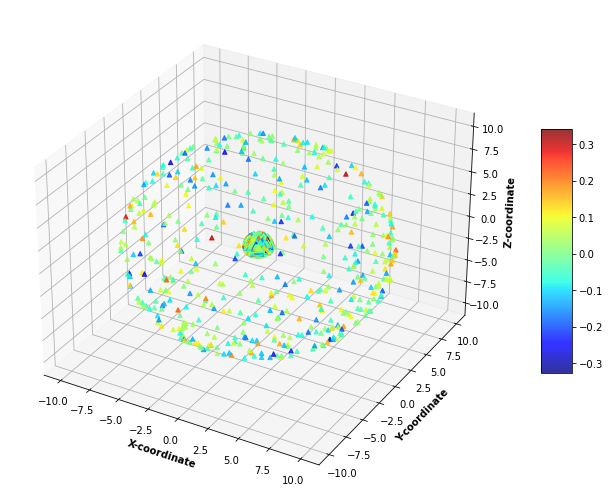

In [249]:
n = 1000
sigma_noise = 0.1

Sphere_matrix = np.zeros((n,3))
Sphere_labels = np.concatenate((np.zeros(int(n/2)), np.zeros(int(n/2)))) + np.random.normal(0,sigma_noise,n)

Sphere_matrix[:,0] = np.random.normal(0,1, n)
Sphere_matrix[:,1] = np.random.normal(0,1, n)
Sphere_matrix[:,2] = np.random.normal(0,1, n)

for i in np.arange(n):
    norm = np.sqrt(np.sum(np.square(Sphere_matrix[i,:])))
    Sphere_matrix[i,:] = Sphere_matrix[i,:] / norm
    
Sphere_matrix[0:int(n/2),:] = Sphere_matrix[0:int(n/2),:] * 10

x = Sphere_matrix[:,0]
y = Sphere_matrix[:,1]
z = Sphere_matrix[:,2]

fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")

ax.grid(b = True, color ='grey',linestyle ='-.', linewidth = 0.3, alpha = 0.2)
 
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = Sphere_labels,
                    cmap = my_cmap,
                    marker ='^')
 
#plt.title("3D scatter plot of the mean centered data")
ax.set_xlabel('X-coordinate', fontweight ='bold')
ax.set_ylabel('Y-coordinate', fontweight ='bold')
ax.set_zlabel('Z-coordinate', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 8)

plt.show()

fixed bandwidth specified


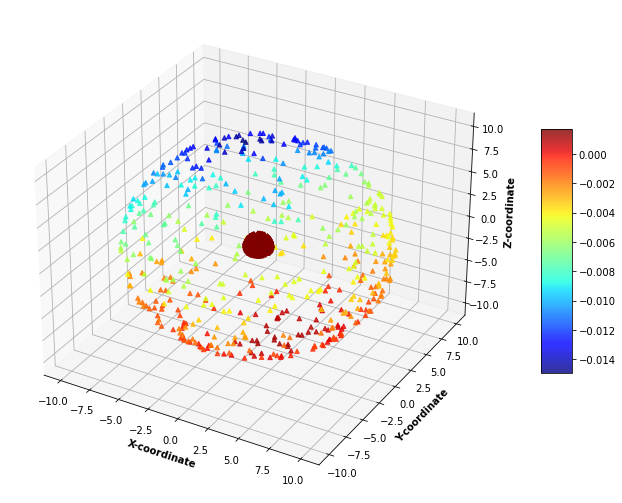

In [250]:
W = gaussian_kernel(Sphere_matrix, kernel_type="gaussian", sigma=3.0, k=5)
lapl = L(W, normalized=True)
eval_sphere, evec_sphere = compute_fourier_basis(lapl)
H_LPfilter_sphere = filterbank_matrix(evec_sphere, eval_sphere, lambda x: int(x<0.1))
Sphere_labels_filtered = H_LPfilter_sphere @ Sphere_labels

fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")

ax.grid(b = True, color ='grey',linestyle ='-.', linewidth = 0.3, alpha = 0.2)
 
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = Sphere_labels_filtered,
                    cmap = my_cmap,
                    marker ='^')
 
#plt.title("3D scatter plot of the mean centered data")
ax.set_xlabel('X-coordinate', fontweight ='bold')
ax.set_ylabel('Y-coordinate', fontweight ='bold')
ax.set_zlabel('Z-coordinate', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 8)

plt.show()

In [600]:
xx, yy, GMM_64 = sbm(500, 8, 0.25, 0.65, sigma = 0.01)

W = gaussian_kernel(GMM_64, kernel_type="gaussian", sigma=0.5, k=5)
lapl = L(W, normalized=True)
labels_kmeans_sphere_05 = SC(lapl, 8, psi=None, nrep=5, itermax=300, sklearn=False)

W = gaussian_kernel(GMM_64, kernel_type="gaussian", sigma=1.0, k=5)
lapl = L(W, normalized=True)
labels_kmeans_sphere_1 = SC(lapl, 8, psi=None, nrep=5, itermax=300, sklearn=False)

W = gaussian_kernel(GMM_64, kernel_type="gaussian", sigma=3.0, k=5)
lapl = L(W, normalized=True)
labels_kmeans_sphere_3 = SC(lapl, 8, psi=None, nrep=5, itermax=300, sklearn=False)

W = gaussian_kernel(GMM_64, kernel_type="gaussian", sigma=6.0, k=5)
lapl = L(W, normalized=True)
labels_kmeans_sphere_6 = SC(lapl, 8, psi=None, nrep=5, itermax=300, sklearn=False)

W = gaussian_kernel(GMM_64, kernel_type="gaussian", sigma=12.0, k=5)
lapl = L(W, normalized=True)
labels_kmeans_sphere_12 = SC(lapl, 8, psi=None, nrep=5, itermax=300, sklearn=False)

W = gaussian_kernel(GMM_64, kernel_type="gaussian", sigma=100.0, k=5)
lapl = L(W, normalized=True)
labels_kmeans_sphere_20 = SC(lapl, 8, psi=None, nrep=5, itermax=300, sklearn=False)

fixed bandwidth specified
fixed bandwidth specified
fixed bandwidth specified
fixed bandwidth specified
fixed bandwidth specified
fixed bandwidth specified


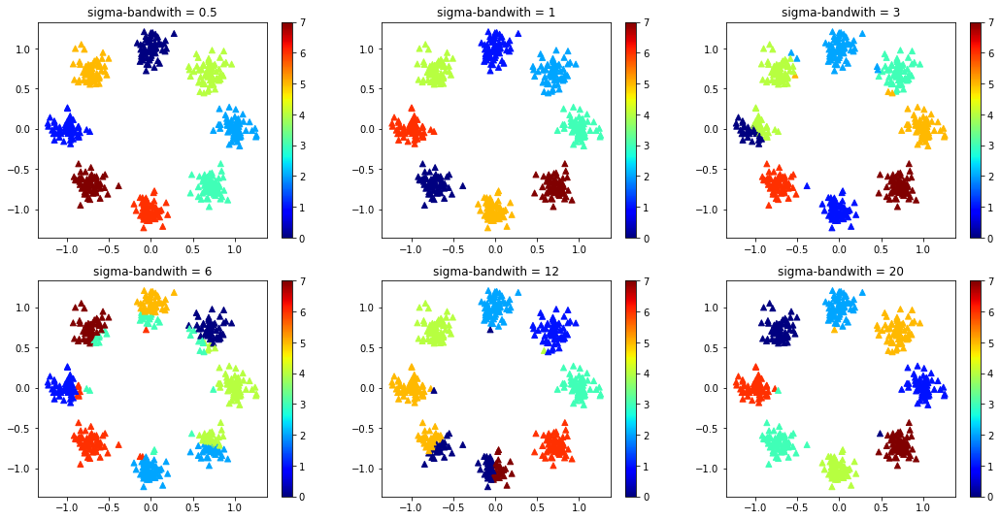

In [601]:
f, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (18,9))
axes = axes.ravel()

scat = axes[0].scatter(GMM_64[:,0], GMM_64[:,1], c = labels_kmeans_sphere_05, cmap = my_cmap, marker ='^')
axes[0].set_title(f'sigma-bandwith = 0.5')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(GMM_64[:,0], GMM_64[:,1], c = labels_kmeans_sphere_1, cmap = my_cmap, marker ='^')
axes[1].set_title(f'sigma-bandwith = 1')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(GMM_64[:,0], GMM_64[:,1], c = labels_kmeans_sphere_3, cmap = my_cmap, marker ='^')
axes[2].set_title(f'sigma-bandwith = 3')
plt.colorbar(scat, ax = axes[2])

scat = axes[3].scatter(GMM_64[:,0], GMM_64[:,1], c = labels_kmeans_sphere_6, cmap = my_cmap, marker ='^')
axes[3].set_title(f'sigma-bandwith = 6')
plt.colorbar(scat, ax = axes[3])

scat = axes[4].scatter(GMM_64[:,0], GMM_64[:,1], c = labels_kmeans_sphere_12, cmap = my_cmap, marker ='^')
axes[4].set_title(f'sigma-bandwith = 12')
plt.colorbar(scat, ax = axes[4])

scat = axes[5].scatter(GMM_64[:,0], GMM_64[:,1], c = labels_kmeans_sphere_20, cmap = my_cmap, marker ='^')
axes[5].set_title(f'sigma-bandwith = 20')
plt.colorbar(scat, ax = axes[5])

plt.show()

# 7) Using Louvain, and trying out PHATE and tSNE

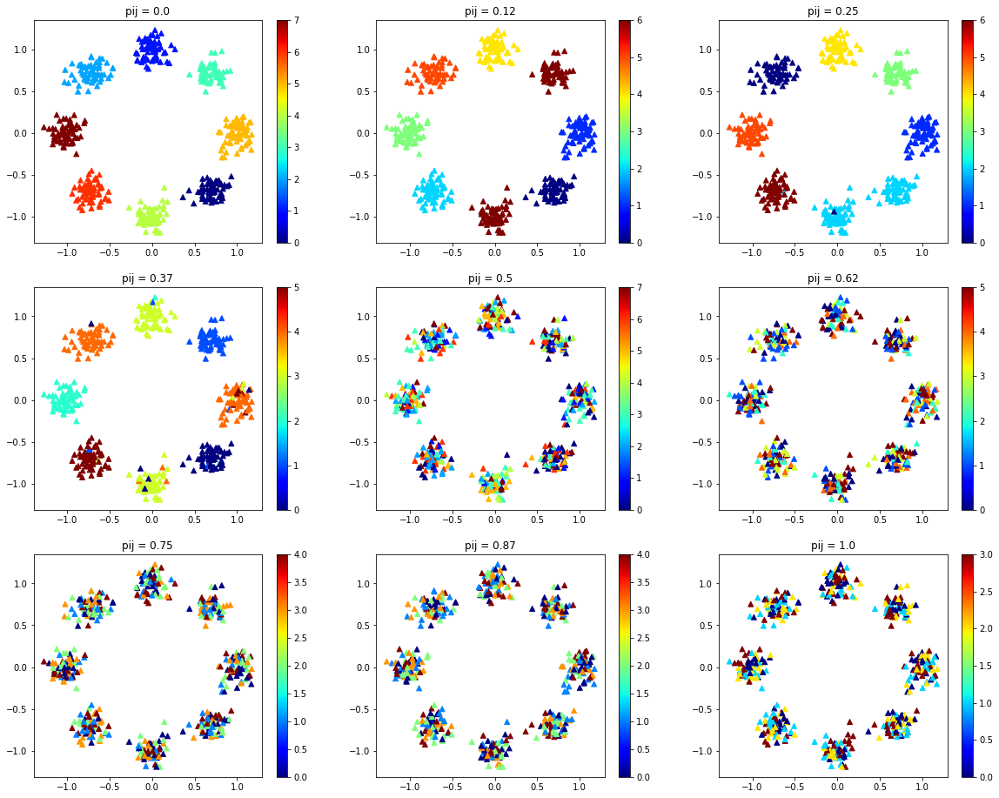

In [337]:
mn = 3
fig, axes = plt.subplots(nrows = mn, ncols = mn, figsize = (20, 16))
axes = axes.ravel()
num = 0

my_cmap = plt.get_cmap('jet')

for i in np.arange(0,mn*mn):
    Adj, gtruth, coordsBlobs = sbm(500, 8, i*(1.12/(mn*mn)), 0.65, 0.01)
    G = nx.from_numpy_matrix(Adj)
    partition = community_louvain.best_partition(G, resolution = 1)
    scat = axes[num].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = list(partition.values()), cmap = my_cmap, marker ='^')
    axes[num].set_title(f'pij = {round(i*(1.12/(mn*mn)),2)}')
    plt.colorbar(scat, ax = axes[num])
    num += 1

plt.show()

In [314]:
xx, yy, GMM_71_01 = sbm(500, 8, 0.25, 0.65, sigma = 0.01)
xx, yy, GMM_71_03 = sbm(500, 8, 0.25, 0.65, sigma = 0.09)
xx, yy, GMM_71_05 = sbm(500, 8, 0.25, 0.65, sigma = 0.25)

W_01 = gaussian_kernel(GMM_71_01, kernel_type="adaptive", sigma=3.0, k=5)
W_03 = gaussian_kernel(GMM_71_03, kernel_type="adaptive", sigma=3.0, k=5)
W_05 = gaussian_kernel(GMM_71_05, kernel_type="adaptive", sigma=3.0, k=5)

G_01 = nx.from_numpy_matrix(W_01)
G_03 = nx.from_numpy_matrix(W_03)
G_05 = nx.from_numpy_matrix(W_05)

partition_01 = community_louvain.best_partition(G_01)
partition_03 = community_louvain.best_partition(G_03)
partition_05 = community_louvain.best_partition(G_05)

adaptive bandwidth specified
adaptive bandwidth specified
adaptive bandwidth specified


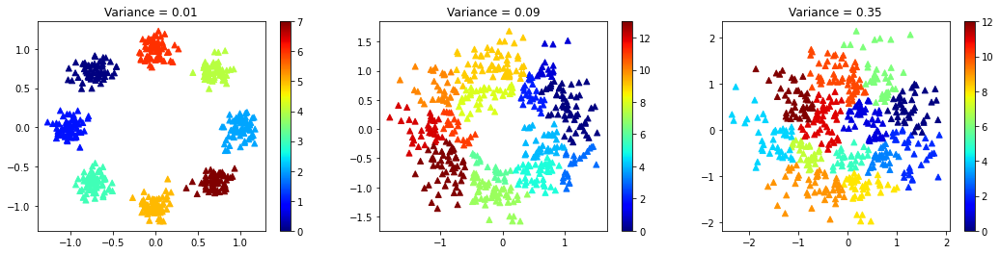

In [315]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

scat = axes[0].scatter(GMM_71_01[:,0], GMM_71_01[:,1], c = list(partition_01.values()), cmap = my_cmap, marker ='^')
axes[0].set_title(f'Variance = 0.01')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(GMM_71_03[:,0], GMM_71_03[:,1], c = list(partition_03.values()), cmap = my_cmap, marker ='^')
axes[1].set_title(f'Variance = 0.09')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(GMM_71_05[:,0], GMM_71_05[:,1], c = list(partition_05.values()), cmap = my_cmap, marker ='^')
axes[2].set_title(f'Variance = 0.35')
plt.colorbar(scat, ax = axes[2])

plt.show()

In [312]:
xx, yy, GMM_71_01 = sbm(500, 8, 0.25, 0.65, sigma = 0.01)
xx, yy, GMM_71_03 = sbm(500, 8, 0.25, 0.65, sigma = 0.09)
xx, yy, GMM_71_05 = sbm(500, 8, 0.25, 0.65, sigma = 0.25)

W_01 = gaussian_kernel(GMM_71_01, kernel_type="gaussian", sigma=0.1, k=5)
W_03 = gaussian_kernel(GMM_71_03, kernel_type="gaussian", sigma=0.2, k=5)
W_05 = gaussian_kernel(GMM_71_05, kernel_type="gaussian", sigma=0.3, k=5)

G_01 = nx.from_numpy_matrix(W_01)
G_03 = nx.from_numpy_matrix(W_03)
G_05 = nx.from_numpy_matrix(W_05)

partition_01 = community_louvain.best_partition(G_01)
partition_03 = community_louvain.best_partition(G_03)
partition_05 = community_louvain.best_partition(G_05)

fixed bandwidth specified
fixed bandwidth specified
fixed bandwidth specified


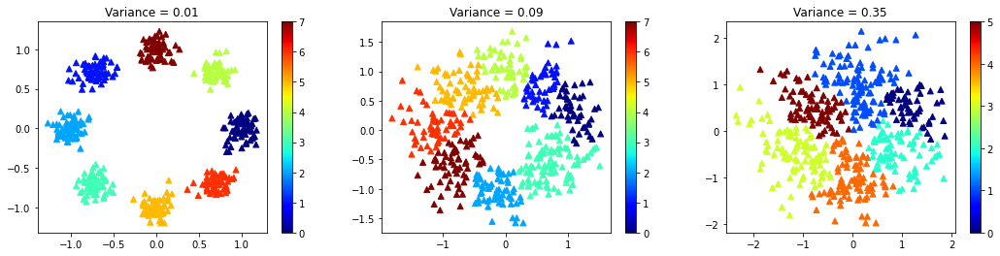

In [313]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

scat = axes[0].scatter(GMM_71_01[:,0], GMM_71_01[:,1], c = list(partition_01.values()), cmap = my_cmap, marker ='^')
axes[0].set_title(f'Variance = 0.01')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(GMM_71_03[:,0], GMM_71_03[:,1], c = list(partition_03.values()), cmap = my_cmap, marker ='^')
axes[1].set_title(f'Variance = 0.09')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(GMM_71_05[:,0], GMM_71_05[:,1], c = list(partition_05.values()), cmap = my_cmap, marker ='^')
axes[2].set_title(f'Variance = 0.35')
plt.colorbar(scat, ax = axes[2])

plt.show()

fixed bandwidth specified


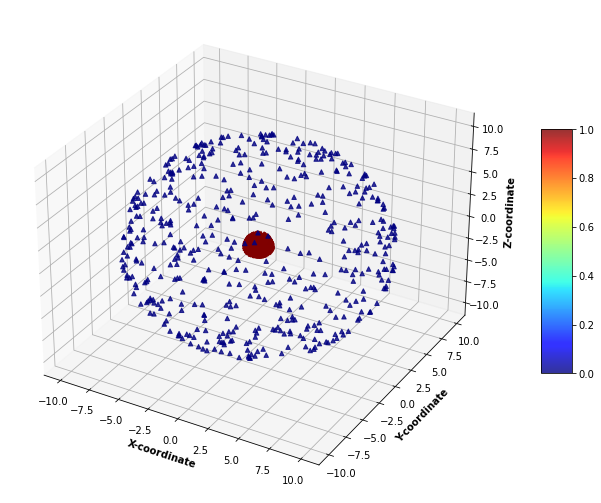

In [316]:
n = 1000

Sphere_matrix = np.zeros((n,3))
Sphere_labels = np.concatenate((np.zeros(int(n/2)), np.ones(int(n/2))))

Sphere_matrix[:,0] = np.random.normal(0,1, n)
Sphere_matrix[:,1] = np.random.normal(0,1, n)
Sphere_matrix[:,2] = np.random.normal(0,1, n)

for i in np.arange(n):
    norm = np.sqrt(np.sum(np.square(Sphere_matrix[i,:])))
    Sphere_matrix[i,:] = Sphere_matrix[i,:] / norm
    
Sphere_matrix[0:int(n/2),:] = Sphere_matrix[0:int(n/2),:] * 10
    
W_sphere = gaussian_kernel(Sphere_matrix, kernel_type="gaussian", sigma=4.0, k=5)
G_sphere = nx.from_numpy_matrix(W_sphere)
partition_sphere_good = community_louvain.best_partition(G_sphere)

x = Sphere_matrix[:,0]
y = Sphere_matrix[:,1]
z = Sphere_matrix[:,2]

fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")

ax.grid(b = True, color ='grey',linestyle ='-.', linewidth = 0.3, alpha = 0.2)
 
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = list(partition_sphere_good.values()),
                    cmap = my_cmap,
                    marker ='^')
 
#plt.title("3D scatter plot of the mean centered data")
ax.set_xlabel('X-coordinate', fontweight ='bold')
ax.set_ylabel('Y-coordinate', fontweight ='bold')
ax.set_zlabel('Z-coordinate', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 8)

plt.show()

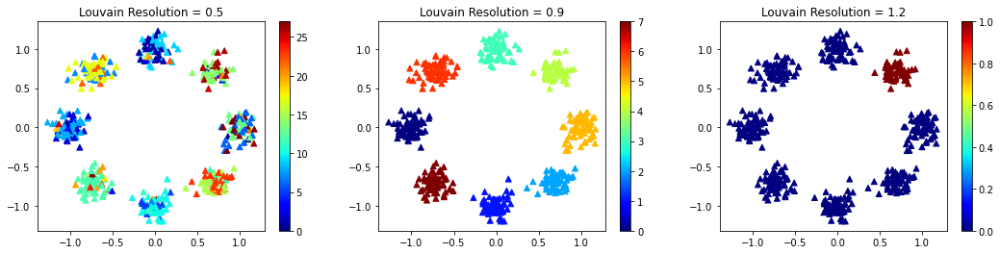

In [318]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

Adj, gtruth, coordsBlobs = sbm(500, 8, 0.25, 0.65, 0.01)
G = nx.from_numpy_matrix(Adj)


partition = community_louvain.best_partition(G, resolution = 0.5)
scat = axes[0].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = list(partition.values()), cmap = my_cmap, marker ='^')
axes[0].set_title(f'Louvain Resolution = {0.5}')
plt.colorbar(scat, ax = axes[0])

partition = community_louvain.best_partition(G, resolution = 0.90)
scat = axes[1].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = list(partition.values()), cmap = my_cmap, marker ='^')
axes[1].set_title(f'Louvain Resolution = {0.90}')
plt.colorbar(scat, ax = axes[1])

partition = community_louvain.best_partition(G, resolution = 1.2)
scat = axes[2].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = list(partition.values()), cmap = my_cmap, marker ='^')
axes[2].set_title(f'Louvain Resolution = {1.2}')
plt.colorbar(scat, ax = axes[2])

plt.show()

adaptive bandwidth specified


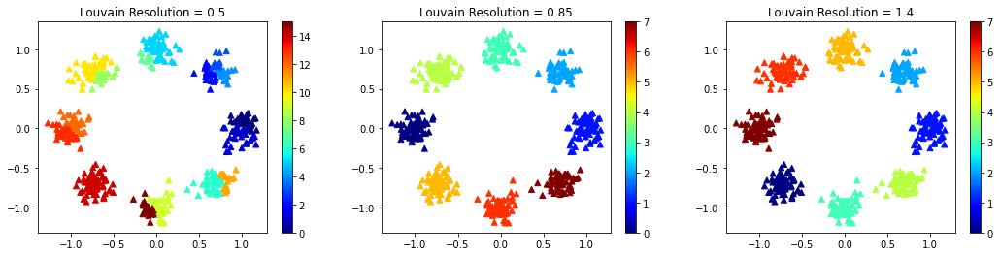

In [321]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 4))
axes = axes.ravel()

xx, yy, coordsBlobs = sbm(500, 8, 0.25, 0.65, sigma = 0.01)
W_01 = gaussian_kernel(GMM_71_01, kernel_type="adaptive", sigma=3.0, k=5)
G_01 = nx.from_numpy_matrix(W_01)

partition = community_louvain.best_partition(G_01, resolution = 0.5)
scat = axes[0].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = list(partition.values()), cmap = my_cmap, marker ='^')
axes[0].set_title(f'Louvain Resolution = {0.5}')
plt.colorbar(scat, ax = axes[0])

partition = community_louvain.best_partition(G_01, resolution = 0.85)
scat = axes[1].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = list(partition.values()), cmap = my_cmap, marker ='^')
axes[1].set_title(f'Louvain Resolution = {0.85}')
plt.colorbar(scat, ax = axes[1])

partition = community_louvain.best_partition(G_01, resolution = 1.2)
scat = axes[2].scatter(coordsBlobs[:,0], coordsBlobs[:,1], c = list(partition.values()), cmap = my_cmap, marker ='^')
axes[2].set_title(f'Louvain Resolution = {1.4}')
plt.colorbar(scat, ax = axes[2])

plt.show()

fixed bandwidth specified


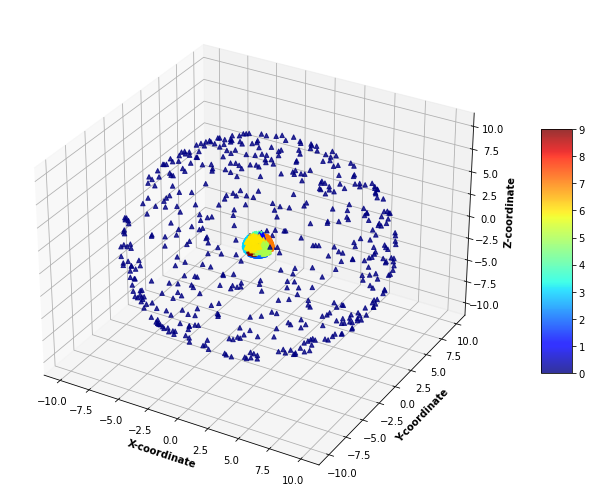

In [322]:
n = 1000

Sphere_matrix = np.zeros((n,3))
Sphere_labels = np.concatenate((np.zeros(int(n/2)), np.ones(int(n/2))))

Sphere_matrix[:,0] = np.random.normal(0,1, n)
Sphere_matrix[:,1] = np.random.normal(0,1, n)
Sphere_matrix[:,2] = np.random.normal(0,1, n)

for i in np.arange(n):
    norm = np.sqrt(np.sum(np.square(Sphere_matrix[i,:])))
    Sphere_matrix[i,:] = Sphere_matrix[i,:] / norm
    
Sphere_matrix[0:int(n/2),:] = Sphere_matrix[0:int(n/2),:] * 10
    
W_sphere = gaussian_kernel(Sphere_matrix, kernel_type="gaussian", sigma=4.0, k=5)
G_sphere = nx.from_numpy_matrix(W_sphere)
partition_sphere = community_louvain.best_partition(G_sphere, resolution = 0.9)

x = Sphere_matrix[:,0]
y = Sphere_matrix[:,1]
z = Sphere_matrix[:,2]

fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")

ax.grid(b = True, color ='grey',linestyle ='-.', linewidth = 0.3, alpha = 0.2)
 
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = list(partition_sphere.values()),
                    cmap = my_cmap,
                    marker ='^')
 
#plt.title("3D scatter plot of the mean centered data")
ax.set_xlabel('X-coordinate', fontweight ='bold')
ax.set_ylabel('Y-coordinate', fontweight ='bold')
ax.set_zlabel('Z-coordinate', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 8)

plt.show()

fixed bandwidth specified


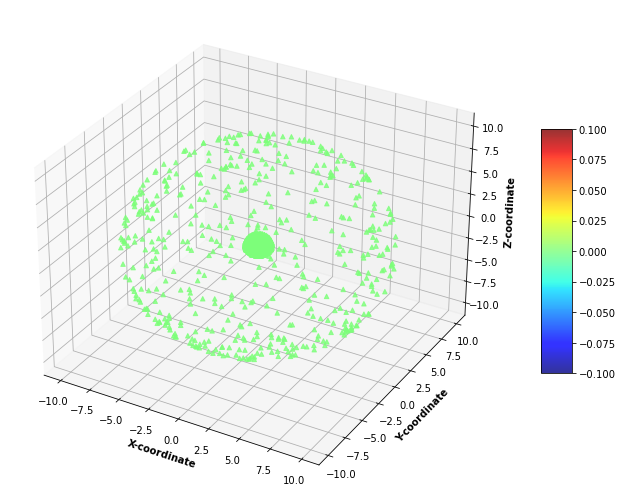

In [332]:
n = 1000

Sphere_matrix = np.zeros((n,3))
Sphere_labels = np.concatenate((np.zeros(int(n/2)), np.ones(int(n/2))))

Sphere_matrix[:,0] = np.random.normal(0,1, n)
Sphere_matrix[:,1] = np.random.normal(0,1, n)
Sphere_matrix[:,2] = np.random.normal(0,1, n)

for i in np.arange(n):
    norm = np.sqrt(np.sum(np.square(Sphere_matrix[i,:])))
    Sphere_matrix[i,:] = Sphere_matrix[i,:] / norm
    
Sphere_matrix[0:int(n/2),:] = Sphere_matrix[0:int(n/2),:] * 10
    
W_sphere = gaussian_kernel(Sphere_matrix, kernel_type="gaussian", sigma=4.0, k=5)
G_sphere = nx.from_numpy_matrix(W_sphere)
partition_sphere = community_louvain.best_partition(G_sphere, resolution = 18.0)

x = Sphere_matrix[:,0]
y = Sphere_matrix[:,1]
z = Sphere_matrix[:,2]

fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")

ax.grid(b = True, color ='grey',linestyle ='-.', linewidth = 0.3, alpha = 0.2)
 
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = list(partition_sphere.values()),
                    cmap = my_cmap,
                    marker ='^')
 
#plt.title("3D scatter plot of the mean centered data")
ax.set_xlabel('X-coordinate', fontweight ='bold')
ax.set_ylabel('Y-coordinate', fontweight ='bold')
ax.set_zlabel('Z-coordinate', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 8)

plt.show()

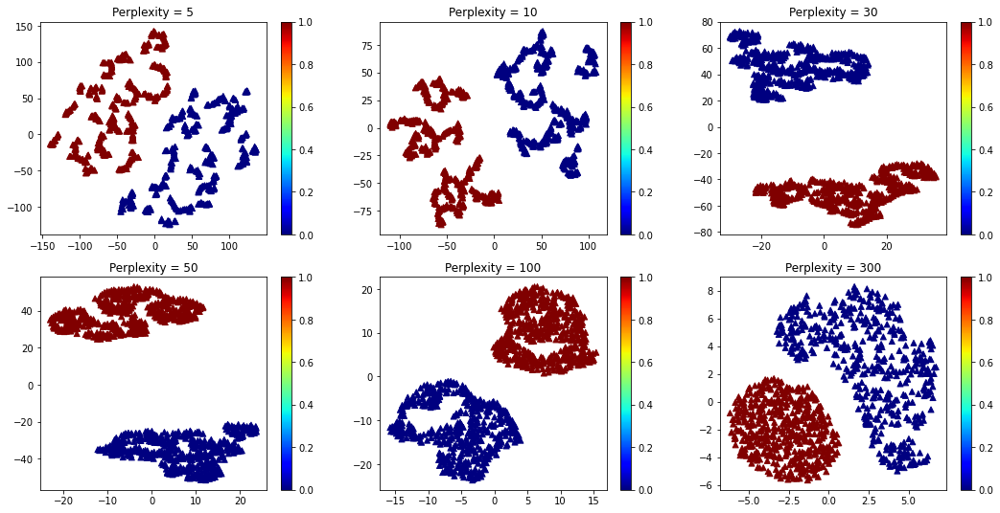

In [329]:
fig, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (18, 9))
axes = axes.ravel()


tsne_op = TSNE(n_components=2, perplexity=5, n_iter = 5000)
data_tsne = tsne_op.fit_transform(Sphere_matrix)
scat = axes[0].scatter(data_tsne[:,0], data_tsne[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[0].set_title(f'Perplexity = {5}')
plt.colorbar(scat, ax = axes[0])

tsne_op = TSNE(n_components=2, perplexity=10, n_iter = 5000)
data_tsne = tsne_op.fit_transform(Sphere_matrix)
scat = axes[1].scatter(data_tsne[:,0], data_tsne[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[1].set_title(f'Perplexity = {10}')
plt.colorbar(scat, ax = axes[1])

tsne_op = TSNE(n_components=2, perplexity=30, n_iter = 5000)
data_tsne = tsne_op.fit_transform(Sphere_matrix)
scat = axes[2].scatter(data_tsne[:,0], data_tsne[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[2].set_title(f'Perplexity = {30}')
plt.colorbar(scat, ax = axes[2])

tsne_op = TSNE(n_components=2, perplexity=50, n_iter = 5000)
data_tsne = tsne_op.fit_transform(Sphere_matrix)
scat = axes[3].scatter(data_tsne[:,0], data_tsne[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[3].set_title(f'Perplexity = {50}')
plt.colorbar(scat, ax = axes[3])

tsne_op = TSNE(n_components=2, perplexity=100, n_iter = 5000)
data_tsne = tsne_op.fit_transform(Sphere_matrix)
scat = axes[4].scatter(data_tsne[:,0], data_tsne[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[4].set_title(f'Perplexity = {100}')
plt.colorbar(scat, ax = axes[4])

tsne_op = TSNE(n_components=2, perplexity=300, n_iter = 5000)
data_tsne = tsne_op.fit_transform(Sphere_matrix)
scat = axes[5].scatter(data_tsne[:,0], data_tsne[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[5].set_title(f'Perplexity = {300}')
plt.colorbar(scat, ax = axes[5])

plt.show()

Calculating PHATE...
  Running PHATE on 1000 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
  Calculated graph and diffusion operator in 0.11 seconds.
  Calculating optimal t...
    Automatically selected t = 26
  Calculated optimal t in 0.63 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.21 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 0.47 seconds.
Calculated PHATE in 1.43 seconds.
Calculating PHATE...
  Running PHATE on 1000 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.01 seconds.
    Calculating affinities...
  Calculated graph and diffusion operator in 0.02 seconds.
  Calculating optimal t...
    Automatically selected t = 26
  Calculated optimal t in 0.64 seconds.
  Calculating diffusion potential...
  Cal

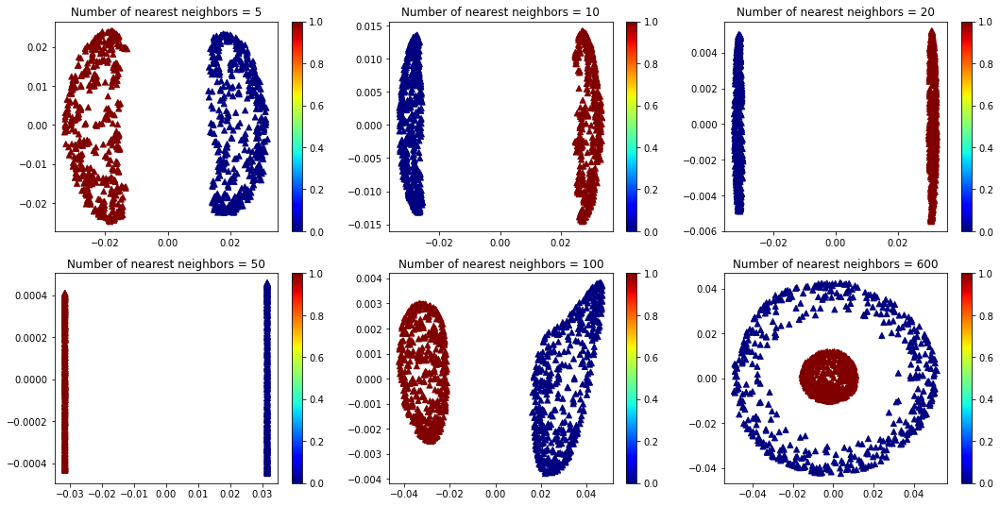

In [333]:
fig, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (18, 9))
axes = axes.ravel()

phate_op = phate.PHATE(knn=5, n_jobs=-2)
data_phate = phate_op.fit_transform(Sphere_matrix)
scat = axes[0].scatter(data_phate[:,0], data_phate[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[0].set_title(f'Number of nearest neighbors = {5}')
plt.colorbar(scat, ax = axes[0])

phate_op = phate.PHATE(knn=10, n_jobs=-2)
data_phate = phate_op.fit_transform(Sphere_matrix)
scat = axes[1].scatter(data_phate[:,0], data_phate[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[1].set_title(f'Number of nearest neighbors = {10}')
plt.colorbar(scat, ax = axes[1])

phate_op = phate.PHATE(knn=20, n_jobs=-2)
data_phate = phate_op.fit_transform(Sphere_matrix)
scat = axes[2].scatter(data_phate[:,0], data_phate[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[2].set_title(f'Number of nearest neighbors = {20}')
plt.colorbar(scat, ax = axes[2])

phate_op = phate.PHATE(knn=50, n_jobs=-2)
data_phate = phate_op.fit_transform(Sphere_matrix)
scat = axes[3].scatter(data_phate[:,0], data_phate[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[3].set_title(f'Number of nearest neighbors = {50}')
plt.colorbar(scat, ax = axes[3])

phate_op = phate.PHATE(knn=100, n_jobs=-2)
data_phate = phate_op.fit_transform(Sphere_matrix)
scat = axes[4].scatter(data_phate[:,0], data_phate[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[4].set_title(f'Number of nearest neighbors = {100}')
plt.colorbar(scat, ax = axes[4])

phate_op = phate.PHATE(knn=600, n_jobs=-2)
data_phate = phate_op.fit_transform(Sphere_matrix)
scat = axes[5].scatter(data_phate[:,0], data_phate[:,1], c = list(partition_sphere_good.values()), cmap = my_cmap, marker ='^')
axes[5].set_title(f'Number of nearest neighbors = {600}')
plt.colorbar(scat, ax = axes[5])

plt.show()

# 8) Retinal Bipolar dataset

In [428]:
retinal_metadata = pd.read_pickle("/Users/louisdeschuttere/Documents/Yale University/Semester 1/Unsupervised Learning/Assignments/Homework2/data/retinal-bipolar-metadata.pickle")
retinal_data = pd.read_pickle("/Users/louisdeschuttere/Documents/Yale University/Semester 1/Unsupervised Learning/Assignments/Homework2/data/retinal-bipolar-data.pickle")

In [429]:
retinal_data_pca = scprep.reduce.pca(retinal_data, n_components=100)

In [430]:
df_data = scprep.select.subsample(retinal_data_pca, n=3000, seed=8888)
new_data = df_data.to_numpy()

(3000, 100)

In [563]:
df_metadata = retinal_metadata.loc[df_data.index]
df_metadata["CLUSTER"] = df_metadata["CLUSTER"].astype(int) + 1
df_metadata["SUB-CLUSTER"] = df_metadata["SUB-CLUSTER"].astype(int) + 1
df_metadata["CELLTYPE"] = pd.factorize(df_metadata["CELLTYPE"].values)[0] 
new_metadata = df_metadata.to_numpy()

In [564]:
W_retinal = gaussian_kernel(new_data, kernel_type="adaptive", sigma=3.0, k=10)
L_retinal = L(W_retinal)
e_retinal, psi_retinal = compute_fourier_basis(L_retinal)
G_retinal = nx.from_numpy_matrix(W_retinal)
H_retinal = filterbank_matrix(psi_retinal, e_retinal, lambda x: int(x<0.2))

adaptive bandwidth specified


In [565]:
s_column0 = new_metadata[:,0]
s_column1 = new_metadata[:,1]
s_column2 = new_metadata[:,2]

In [566]:
labels_kmeans = kmeans(new_data, 15, nrep=5, itermax=300)
labels_SC = SC(L_retinal, 15, psi=None, nrep=5, itermax=300, sklearn=False)
labels_louvain = list(community_louvain.best_partition(G_retinal, resolution = 0.9).values())

PHATE

In [567]:
phate_op = phate.PHATE(knn=5, n_jobs=-2)
data_phate = phate_op.fit_transform(new_data)

Calculating PHATE...
  Running PHATE on 3000 observations and 100 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.28 seconds.
    Calculating affinities...
    Calculated affinities in 0.10 seconds.
  Calculated graph and diffusion operator in 0.39 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.30 seconds.
    Calculating KMeans...
    Calculated KMeans in 14.93 seconds.
  Calculated landmark operator in 15.94 seconds.
  Calculating optimal t...
    Automatically selected t = 30
  Calculated optimal t in 4.96 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.53 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.86 seconds.
Calculated PHATE in 26.68 seconds.


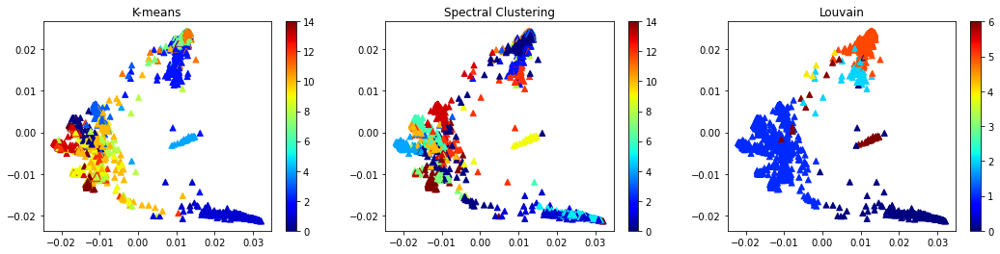

In [568]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

scat = axes[0].scatter(data_phate[:,0], data_phate[:,1], c = labels_kmeans, cmap = my_cmap, marker ='^')
axes[0].set_title(f'K-means')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(data_phate[:,0], data_phate[:,1], c = labels_SC, cmap = my_cmap, marker ='^')
axes[1].set_title(f'Spectral Clustering')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(data_phate[:,0], data_phate[:,1], c = labels_louvain, cmap = my_cmap, marker ='^')
axes[2].set_title(f'Louvain')
plt.colorbar(scat, ax = axes[2])

plt.show()

TSNE

In [569]:
tsne_op = TSNE(n_components=2, perplexity = 25, n_iter = 5000, learning_rate = 100)
data_tsne = tsne_op.fit_transform(new_data)

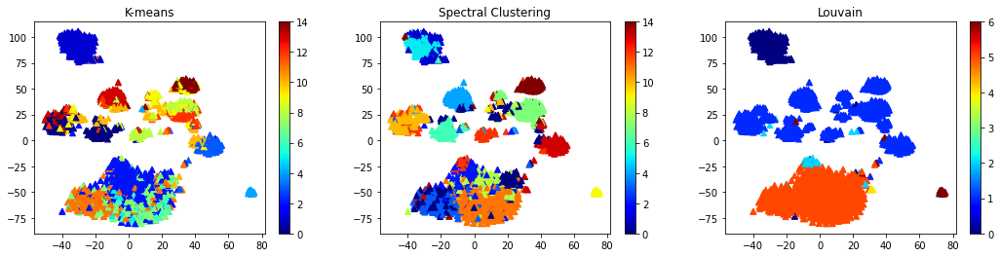

In [570]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

scat = axes[0].scatter(data_tsne[:,0], data_tsne[:,1], c = labels_kmeans, cmap = my_cmap, marker ='^')
axes[0].set_title(f'K-means')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(data_tsne[:,0], data_tsne[:,1], c = labels_SC, cmap = my_cmap, marker ='^')
axes[1].set_title(f'Spectral Clustering')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(data_tsne[:,0], data_tsne[:,1], c = labels_louvain, cmap = my_cmap, marker ='^')
axes[2].set_title(f'Louvain')
plt.colorbar(scat, ax = axes[2])

plt.show()

Second and Third eigenvectors

In [571]:
e_retinal, psi_retinal = compute_fourier_basis(L_retinal)

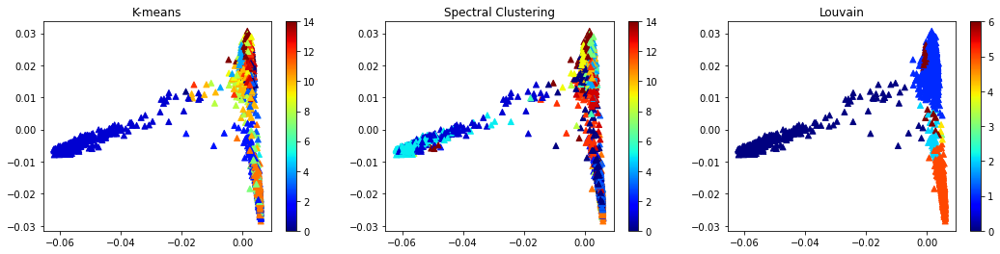

In [572]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

scat = axes[0].scatter(psi_retinal[:,1], psi_retinal[:,2], c = labels_kmeans, cmap = my_cmap, marker ='^')
axes[0].set_title(f'K-means')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(psi_retinal[:,1], psi_retinal[:,2], c = labels_SC, cmap = my_cmap, marker ='^')
axes[1].set_title(f'Spectral Clustering')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(psi_retinal[:,1], psi_retinal[:,2], c = labels_louvain, cmap = my_cmap, marker ='^')
axes[2].set_title(f'Louvain')
plt.colorbar(scat, ax = axes[2])

plt.show()

Vary the parameter k

In [602]:
W_retinal = gaussian_kernel(new_data, kernel_type="adaptive", sigma=3.0, k=10)
L_retinal = L(W_retinal)
G_retinal = nx.from_numpy_matrix(W_retinal)

labels_kmeans = kmeans(new_data, 15, nrep=5, itermax=300)
labels_SC = SC(L_retinal, 15, psi=None, nrep=5, itermax=300, sklearn=False)
labels_louvain = list(community_louvain.best_partition(G_retinal).values())

phate_op = phate.PHATE(knn=5, n_jobs=-2)
data_phate = phate_op.fit_transform(new_data)

adaptive bandwidth specified
Calculating PHATE...
  Running PHATE on 3000 observations and 100 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.28 seconds.
    Calculating affinities...
    Calculated affinities in 0.10 seconds.
  Calculated graph and diffusion operator in 0.39 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.30 seconds.
    Calculating KMeans...
    Calculated KMeans in 10.61 seconds.
  Calculated landmark operator in 11.57 seconds.
  Calculating optimal t...
    Automatically selected t = 18
  Calculated optimal t in 5.48 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.36 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.66 seconds.
Calculated PHATE in 22.46 seconds.


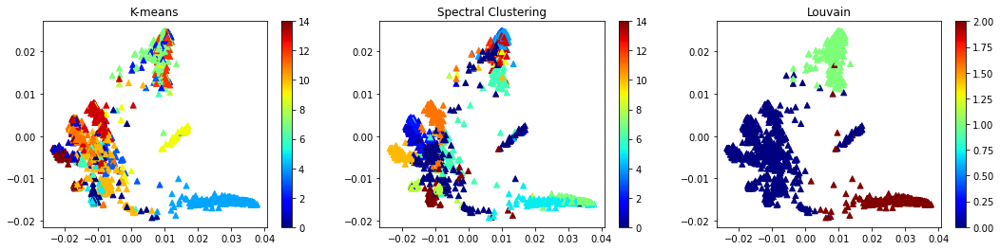

In [603]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

scat = axes[0].scatter(data_phate[:,0], data_phate[:,1], c = labels_kmeans, cmap = my_cmap, marker ='^')
axes[0].set_title(f'K-means')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(data_phate[:,0], data_phate[:,1], c = labels_SC, cmap = my_cmap, marker ='^')
axes[1].set_title(f'Spectral Clustering')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(data_phate[:,0], data_phate[:,1], c = labels_louvain, cmap = my_cmap, marker ='^')
axes[2].set_title(f'Louvain')
plt.colorbar(scat, ax = axes[2])

plt.show()

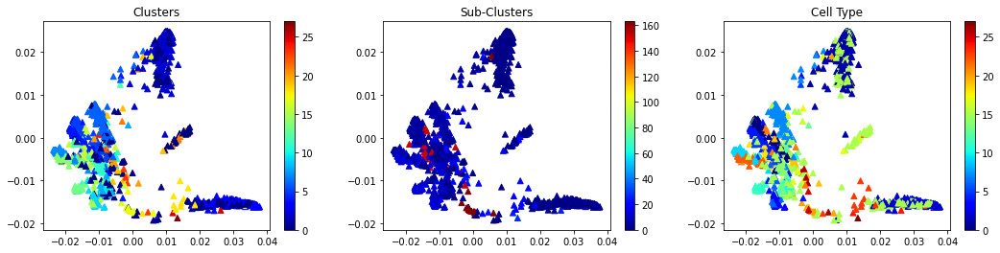

In [604]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

scat = axes[0].scatter(data_phate[:,0], data_phate[:,1], c = new_metadata[:,0], cmap = my_cmap, marker ='^')
axes[0].set_title(f'Clusters')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(data_phate[:,0], data_phate[:,1], c = new_metadata[:,1], cmap = my_cmap, marker ='^')
axes[1].set_title(f'Sub-Clusters')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(data_phate[:,0], data_phate[:,1], c = new_metadata[:,2], cmap = my_cmap, marker ='^')
axes[2].set_title(f'Cell Type')
plt.colorbar(scat, ax = axes[2])

plt.show()

In [605]:
s_column0_fil = H_retinal @ s_column0
s_column1_fil = H_retinal @ s_column1
s_column2_fil = H_retinal @ s_column2

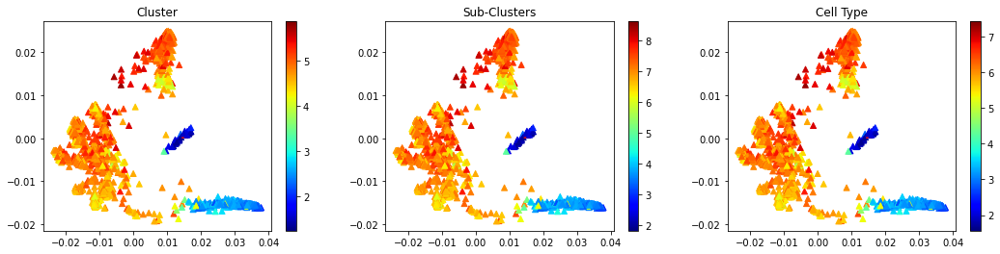

In [606]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

scat = axes[0].scatter(data_phate[:,0], data_phate[:,1], c = s_column0_fil, cmap = my_cmap, marker ='^')
axes[0].set_title(f'Cluster')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(data_phate[:,0], data_phate[:,1], c = s_column1_fil, cmap = my_cmap, marker ='^')
axes[1].set_title(f'Sub-Clusters')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(data_phate[:,0], data_phate[:,1], c = s_column2_fil, cmap = my_cmap, marker ='^')
axes[2].set_title(f'Cell Type')
plt.colorbar(scat, ax = axes[2])

plt.show()

In [607]:
W_binarized = (W_retinal > 0.30).astype(int)
G_binarized = nx.from_numpy_matrix(W_binarized)
labels_louvain025 = list(community_louvain.best_partition(G_binarized).values())

W_binarized = (W_retinal > 0.35).astype(int)
G_binarized = nx.from_numpy_matrix(W_binarized)
labels_louvain050 = list(community_louvain.best_partition(G_binarized).values())

W_binarized = (W_retinal > 0.25).astype(int)
G_binarized = nx.from_numpy_matrix(W_binarized)
labels_louvain075 = list(community_louvain.best_partition(G_binarized).values())

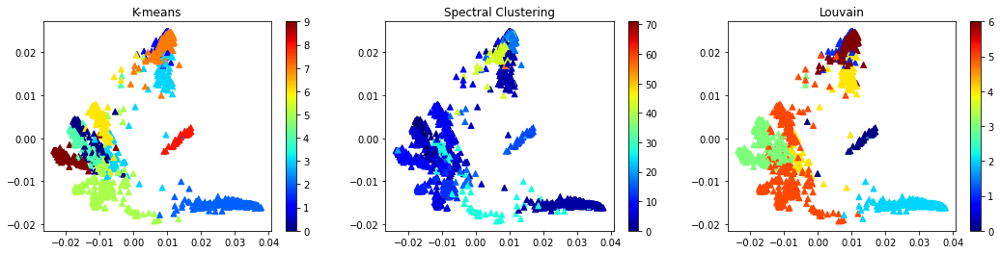

In [608]:
f, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4))
axes = axes.ravel()

scat = axes[0].scatter(data_phate[:,0], data_phate[:,1], c = labels_louvain025, cmap = my_cmap, marker ='^')
axes[0].set_title(f'K-means')
plt.colorbar(scat, ax = axes[0])

scat = axes[1].scatter(data_phate[:,0], data_phate[:,1], c = labels_louvain050, cmap = my_cmap, marker ='^')
axes[1].set_title(f'Spectral Clustering')
plt.colorbar(scat, ax = axes[1])

scat = axes[2].scatter(data_phate[:,0], data_phate[:,1], c = labels_louvain075, cmap = my_cmap, marker ='^')
axes[2].set_title(f'Louvain')
plt.colorbar(scat, ax = axes[2])

plt.show()